In [1]:
from pathlib import Path
import torch
from torch import nn
from torch.nn import functional as nnf
import matplotlib as mpl
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import dvs
from dvs import plots
%load_ext autoreload
%autoreload 2
mpl.rcParams['figure.dpi'] = 300

In [2]:
ensemble = dvs.analysis.EnsembleViews("flow/0092")

In [3]:
validation_subwrap = "original_validation_v2"
validation_loss_fn = "epe"

movingedge_subwrap = f"{validation_subwrap}/{validation_loss_fn}_based/moving_edges"
flash_subwrap = f"{validation_subwrap}/{validation_loss_fn}_based/flashes"

naturalistic_responses_wrap = "naturalistic_responses_v3"
naturalistic_responses_wrap = (
    f"{validation_subwrap}/{validation_loss_fn}_based/{naturalistic_responses_wrap}"
)

In [4]:
ensemble.init_movingbar(subwrap=movingedge_subwrap)

02/20/2023 05:50:50 PM - ValueError: stored spec (other) is not a value-matching superset of the initialized spec (self).
Diff is:
Namespace(
  self = ['+angles: [0, 30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330]'],
  other = ['-angles']
)


In [5]:
average_min_lower_error = 4.814054543321783
average_min_upper_error = 5.692145279943943
normalize = True

average_min_lower_error = None
average_min_upper_error = None
normalize = False


In [6]:
# verify model 0 is model 0
np.argsort(ensemble.task_error(validation_subwrap=validation_subwrap,
                               loss_name=validation_loss_fn).values)

array([ 0,  1,  2,  3, 17,  6,  4, 31,  5,  7, 12, 39, 14, 13, 29, 41, 26,
       24, 32, 20, 30, 15, 16, 10, 11,  9,  8, 23, 36, 25, 22, 33, 34, 19,
       35, 21, 28, 18, 27, 42, 40, 43, 37, 46, 45, 38, 47, 44, 48, 49])

In [17]:
directory = dvs.figure_04_tmy3

# a - embedding & clustering

In [13]:
mpl.rcParams['figure.dpi'] = 300

In [6]:
task_error = ensemble.task_error(
    validation_subwrap=validation_subwrap, loss_name=validation_loss_fn
)

In [7]:
model_mask = ensemble.best_models_mask(
    0.2, validation_subwrap=validation_subwrap, loss_name=validation_loss_fn
)

In [8]:
colors = task_error.colors
# colors[~model_mask] = (0.53, 0.53, 0.53, 0.1)

In [9]:
embedding_kwargs = dict(min_dist=0.12, spread=9.0, random_state=42)

In [10]:
node_type = "TmY3"

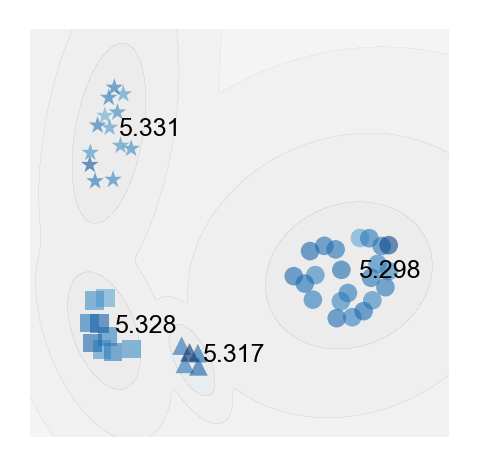

In [15]:
fontsize = 6

embeddingplot = ensemble.cluster_embedding(
    node_type,
    naturalistic_responses_wrap=naturalistic_responses_wrap,
#     color_mask=~model_mask,
    validation_subwrap=validation_subwrap,
    validation_loss_fn=validation_loss_fn,
    embedding_kwargs=embedding_kwargs,
    normalize_task_error=False,
    figsize=[1.8, 1.8],
    plot_mode=None,
    fontsize=6,
    err_x_offset=0.025,
    err_y_offset=0.04
)
embeddingplot.ax.set_title(None)
embeddingplot.fig.suptitle(None)

plt.savefig(
    dvs.figure_04_tmy3
    / f"{node_type}_clustering.pdf",
    bbox_inches="tight",
    transparent=True,
)

02/02/2023 08:09:30 PM - reshaped X from (50, 4536, 80) to (50, 362880)


/home/lappalainenj@hhmi.org/miniconda3/envs/dvs/lib/python3.10/site-packages/umap/umap_.py:1356: RuntimeWarning: divide by zero encountered in power
  return 1.0 / (1.0 + a * x ** (2 * b))


Text(0.5, 0.98, '')

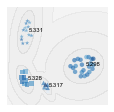

In [18]:
fontsize = 6

embeddingplot = ensemble.cluster_embedding(
    node_type,
    naturalistic_responses_wrap=naturalistic_responses_wrap,
#     color_mask=~model_mask,
    validation_subwrap=validation_subwrap,
    validation_loss_fn=validation_loss_fn,
    embedding_kwargs=embedding_kwargs,
    normalize_task_error=False,
    figsize=[1.8, 1.8],
    plot_mode=None,
    fontsize=6,
    err_x_offset=0.025,
    err_y_offset=0.04
)
embeddingplot.ax.set_title(None)
embeddingplot.fig.suptitle(None)

# plt.savefig(
#     dvs.figure_04_tmy3
#     / f"{node_type}_clustering.pdf",
#     bbox_inches="tight",
#     transparent=True,
# )

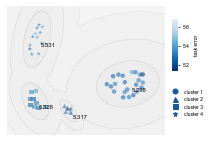

In [21]:
from dvs.analysis.si_cell_profile import si_clustering

validation_subwrap = "original_validation_v2"
validation_loss_fn = "epe"

flash_subwrap = f"{validation_subwrap}/{validation_loss_fn}_based/flashes"
movingedge_subwrap = f"{validation_subwrap}/{validation_loss_fn}_based/moving_edges"
movingbar_subwrap = f"{validation_subwrap}/{validation_loss_fn}_based/moving_bars"

orientededge_subwrap = f"{validation_subwrap}/{validation_loss_fn}_based/oriented_edges"
orientedbar_subwrap = f"{validation_subwrap}/{validation_loss_fn}_based/oriented_bars"

impulse_responses_subwrap = f"{validation_subwrap}/{validation_loss_fn}_based/impulse_responses"
naturalistic_responses_subwrap = "naturalistic_responses_v3"
naturalistic_responses_subwrap = (
    f"{validation_subwrap}/{validation_loss_fn}_based/{naturalistic_responses_subwrap}"
)
nmeis_subwrap = f"{naturalistic_responses_subwrap}/nmeis"
rnmeis_subwrap = f"{naturalistic_responses_subwrap}/rnmeis"

embedding_kwargs = dict(min_dist=0.12, spread=9.0, random_state=42)

max_figure_height_cm = 22
panel_height_cm = 3

max_figure_width_cm = 18
panel_width_cm = 3.6

fontsize = 6

_ = si_clustering(
    node_type,
    ensemble,
    naturalistic_responses_subwrap=naturalistic_responses_subwrap,
    validation_subwrap=validation_subwrap,
    validation_loss_fn=validation_loss_fn,
    embedding_kwargs=embedding_kwargs,
    title="",
    figsizecm=[panel_width_cm * 2, panel_height_cm * 2],
    fontsize=fontsize
)

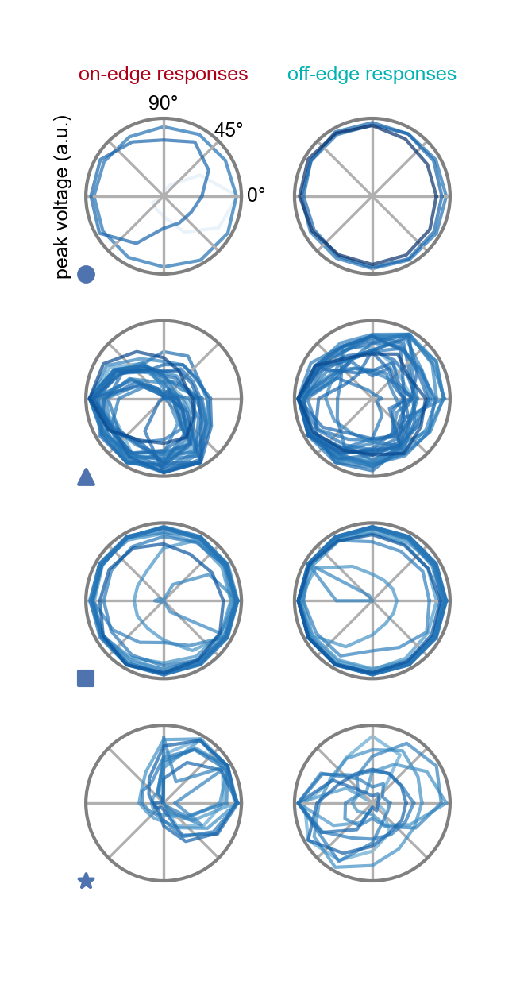

In [55]:
fig, axes = ensemble.cluster_motion_tuning(
    "TmY3",
    subwrap=movingedge_subwrap,
    intensity=[0, 1],
    figsize=[0.94, 2.38],
    ax_title_color="#af0019",
    colors=colors,
#     color_mask=~model_mask,
    validation_subwrap=validation_subwrap,
    fontsize=fontsize,
    loss_name=validation_loss_fn,
    naturalistic_responses_wrap=naturalistic_responses_wrap,
    embedding_kwargs=embedding_kwargs,
)
axes[0, 0].set_title("on-edge responses", fontsize=fontsize, color=dvs.utils.color_utils.ON, y=1.125)
axes[0, 0].set_ylabel("peak voltage (a.u.)", fontsize=fontsize)
axes[0, 1].set_title("off-edge responses", fontsize=fontsize, color=dvs.utils.color_utils.OFF, y=1.125)

for ax in axes[:, 0]:
    for text in ax.texts:
        text.set_text(None)

# axes[0, 0].set_title("on-edge responses", fontsize=fontsize, color="#af0019", y=1.125)

plt.savefig(
    directory / f"TmY3_clusters_motion_tuning.pdf",
    bbox_inches="tight",
    transparent=True,
)

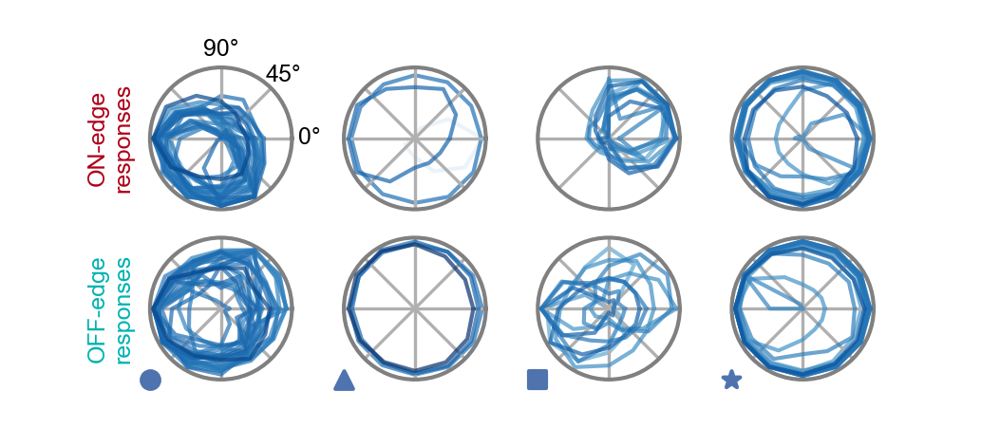

In [41]:
fig, axes = ensemble.cluster_motion_tuning(
    "TmY3",
    subwrap=movingedge_subwrap,
    intensity=[0, 1],
    figsize=None, #[0.94, 2.38],
    ax_title_color="#af0019",
    colors=colors,
#     color_mask=~model_mask,
    validation_subwrap=validation_subwrap,
    fontsize=fontsize,
    loss_name=validation_loss_fn,
    naturalistic_responses_wrap=naturalistic_responses_wrap,
    embedding_kwargs=embedding_kwargs,
    horizontal=True,
    figsizecm=[2.102, 3.48],
    wspace=0.3,
    hspace=0.2
)

axes[0, 0].set_ylabel("ON-edge\nresponses", fontsize=fontsize, color=dvs.utils.color_utils.ON)
axes[1, 0].set_ylabel("OFF-edge\nresponses", fontsize=fontsize, color=dvs.utils.color_utils.OFF)
# axes[0, 0].set_ylabel("peak voltage (a.u.)", fontsize=fontsize)
# axes[0, 1].set_title("off-edge responses", fontsize=fontsize, color=dvs.utils.color_utils.OFF, y=1.125)

# for ax in axes[0, :]:
#     for text in ax.texts:
#         text.set_text(None)

for ax in axes.flatten():
    for text in ax.texts:
        text.set_text(None)
        
plt.savefig(
    directory / f"TmY3_clusters_motion_tuning_horizontal_ensemble.pdf",
    bbox_inches="tight",
    transparent=True,
)

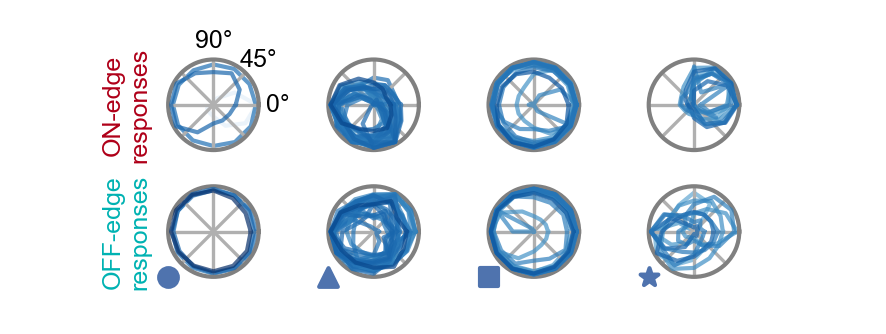

In [649]:
fig, axes = ensemble.cluster_motion_tuning(
    "TmY3",
    subwrap=movingedge_subwrap,
    intensity=[0, 1],
    figsize=None,  # [0.94, 2.38],
    ax_title_color="#af0019",
    colors=colors,
    #     color_mask=~model_mask,
    validation_subwrap=validation_subwrap,
    fontsize=fontsize,
    loss_name=validation_loss_fn,
    naturalistic_responses_wrap=naturalistic_responses_wrap,
    embedding_kwargs=embedding_kwargs,
    horizontal=True,
    #     figsizecm=[2.102, 3.48],
    figsizecm=[1.75, 2.3],
    wspace=0.0,
    hspace=0.4,
)

axes[0, 0].set_ylabel(
    "ON-edge\nresponses", fontsize=fontsize, color=dvs.utils.color_utils.ON
)
axes[1, 0].set_ylabel(
    "OFF-edge\nresponses", fontsize=fontsize, color=dvs.utils.color_utils.OFF
)
# axes[0, 0].set_ylabel("peak voltage (a.u.)", fontsize=fontsize)
# axes[0, 1].set_title("off-edge responses", fontsize=fontsize, color=dvs.utils.color_utils.OFF, y=1.125)

# for ax in axes[0, :]:
#     for text in ax.texts:
#         text.set_text(None)

for ax in axes.flatten():
    for text in ax.texts:
        text.set_text(None)


plt.savefig(
    directory / f"TmY3_clusters_motion_tuning_horizontal_ensemble_small.pdf",
    bbox_inches="tight",
    transparent=True,
)

In [ ]:
fig, axes = ensemble.cluster_motion_tuning(
    "TmY3",
    subwrap=movingedge_subwrap,
    intensity=[0, 1],
    figsize=[0.94, 2.38],
    ax_title_color="#af0019",
    colors=colors,
#     color_mask=~model_mask,
    validation_subwrap=validation_subwrap,
    fontsize=fontsize,
    loss_name=validation_loss_fn,
    naturalistic_responses_wrap=naturalistic_responses_wrap,
    embedding_kwargs=embedding_kwargs,
)

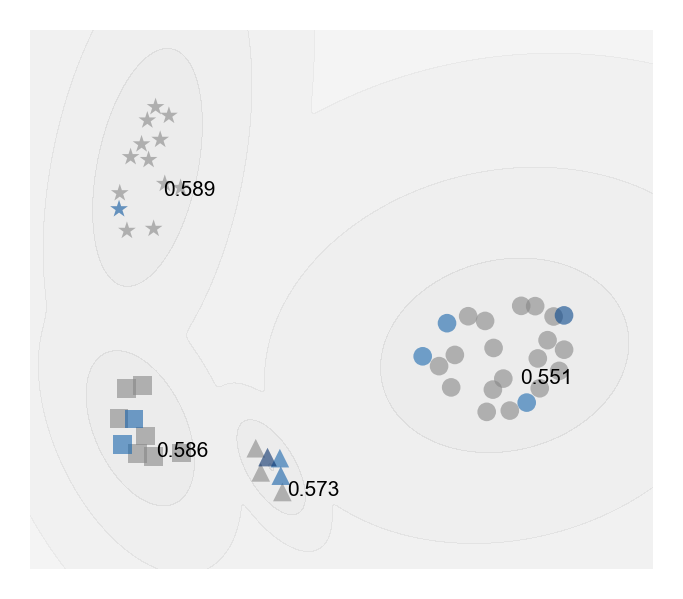

In [13]:
embeddingplot = ensemble.cluster_embedding(
    node_type,
    naturalistic_responses_wrap=naturalistic_responses_wrap,
    color_mask=~model_mask,
    validation_subwrap=validation_subwrap,
    validation_loss_fn=validation_loss_fn,
    embedding_kwargs=embedding_kwargs,
    normalize_task_error=True,
)
plt.savefig(
    dvs.figure_04_tmy3
    / f"{node_type}_clustering_with_error_normalization.pdf",
    bbox_inches="tight",
    transparent=True,
)

# a - dsi

In [19]:
def cluster_node_type_dsi(ensemble, node_type, cluster_indices, intensity, subwrap = movingedge_subwrap):
    
    all_dsis = []
    for cluster, indices in cluster_indices.items():
        with ensemble.model_items(indices):
            dsis, node_types = ensemble.dsis(subwrap, intensity)
        all_dsis.append(dsis[:, node_types == node_type])
        
    return np.array(all_dsis)

In [20]:
cluster_indices = ensemble.cluster_indices(node_type, 
                                           validation_subwrap=validation_subwrap, 
                                           loss_name=validation_loss_fn,
                                           naturalistic_responses_wrap=naturalistic_responses_wrap,
                                           embedding_kwargs=embedding_kwargs)

In [21]:
dsis_on = cluster_node_type_dsi(ensemble, node_type, cluster_indices, 1)

<ipython-input-19-21dc312a64e4>:9: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array(all_dsis)


In [22]:
dsis_off = cluster_node_type_dsi(ensemble, node_type, cluster_indices, 0)

<ipython-input-19-21dc312a64e4>:9: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array(all_dsis)


In [23]:
ensemble.dsis_paper_figure([1], subwrap=movingedge_subwrap, dsis=)

SyntaxError: invalid syntax (<ipython-input-23-73e94f0585ac>, line 1)

In [ ]:
task_error = ensemble.task_error(
    validation_subwrap=validation_subwrap, loss_name=validation_loss_fn
)

In [ ]:
model_mask = ensemble.best_models_mask(
    0.2, validation_subwrap=validation_subwrap, loss_name=validation_loss_fn
)

In [ ]:
colors = task_error.colors
colors[~model_mask] = (0.53, 0.53, 0.53, 0.1)

In [ ]:
colors_mapping = {nnv.name: colors[i] for i, nnv in enumerate(ensemble.values())}

In [ ]:
np.array(dsis_on)[:, None].shape

In [ ]:
dvs.plots.plt_utils.scatter_on_violins_or_bars??

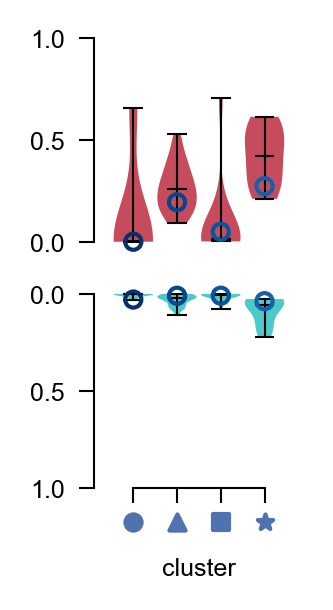

In [22]:
fig = plt.figure(figsize=[0.7, 1.5])
ax1 = fig.add_axes([0, 0.525, 1, 0.475])
dvs.plots.plt_utils.rm_spines(ax1, spines=("bottom",))
ax2 = fig.add_axes([0, 0, 1, 0.475])

scatter_edge_width=1
scatter_best_edge_width=0.75
scatter_edge_color="none"
scatter_face_color="k"
scatter_alpha=0.35
scatter_best_alpha=1.0
scatter_all_marker="o"


dvs.plots.violin_groups(np.array(dsis_on)[:, None], 
#                          figsize=[0.7, 1], 
                         fontsize=6, width=0.9, 
                         scatter=False, 
                         colors=(dvs.utils.color_utils.ON, ),
                         scatter_radius=0.2,
                         violin_alpha=0.7,
                         fig=fig, ax=ax1,
                         mean_median_linewidth=1.5,
                         mean_median_color="k", #"#FF7276", #"white",
                         mean_median_bar_length = 1.0)


ax1.grid(False)
# ax1.set_xticks([0, 1, 2, 3])
# ax1.set_xticklabels([1, 2, 3, 4])
# ax1.set_xlabel("cluster", fontsize=6)
# ax1.set_ylabel("direction selectivity", fontsize=6)

markers = dvs.analysis.clustering.MARKERS
for i, (cluster_id, indices) in enumerate(cluster_indices.items()):
    with ensemble.model_items(indices):
        with ensemble.sort("min", validation_subwrap=validation_subwrap, loss_name=validation_loss_fn):
            nnv = ensemble[0]
            color = colors_mapping[nnv.name]
            _dsis = dsis_on[i].flatten()[0]
    #               ax1.scatter(i, _dsis, s=15, c=color, marker=markers[i], zorder=100)
            ax1.scatter(i, _dsis, s=15, marker="o", facecolor="none", edgecolor=color, zorder=100)
            
dvs.plots.violin_groups(np.array(dsis_off)[:, None], 
#                          figsize=[0.7, 1], 
                         fontsize=6, width=0.9, 
                         scatter=False, 
                         colors=(dvs.utils.color_utils.OFF, ),
                         scatter_radius=0.2,
                        violin_alpha=0.7,
                       fig=fig, ax=ax2)

ax2.grid(False)
ax2.set_xticks(range(len(cluster_indices)))
ax2.set_xticklabels(range(len(cluster_indices)))
ax2.set_xlabel("cluster", fontsize=6)
# ax2.set_ylabel("direction selectivity", fontsize=6)


markers = np.array(["o", "^", "s", "*", "+", "h", "p", "8"])
for i, (cluster_id, indices) in enumerate(cluster_indices.items()):
    with ensemble.model_items(indices):
        with ensemble.sort("min", validation_subwrap=validation_subwrap, loss_name=validation_loss_fn):
            nnv = ensemble[0]
            color = colors_mapping[nnv.name]
            _dsis = dsis_off[i].flatten()[0]
    #               ax1.scatter(i, _dsis, s=15, c=color, marker=markers[i], zorder=100)
            ax2.scatter(i, _dsis, s=15, marker="o", facecolor="none", edgecolor=color, zorder=100)
# markers = np.array(["o", "^", "s", "*", "+", "h", "p", "8"])
# for i, (cluster_id, indices) in enumerate(cluster_indices.items()):
#     with ensemble.model_items(indices):
#         with ensemble.sort("min", subwrap=validation_subwrap):
#             nnv = ensemble[0]
#             color = colors_mapping[nnv.name]
#             _dsis = dsis_off[i].flatten()[0]
#             ax2.scatter(i, _dsis, s=15, marker="o", facecolor="none", edgecolor=color, zorder=100)
            
ax1.set_ylim(-0.05, 1.)
ax2.set_ylim(-0.1, 1.)

plots.plt_utils.trim_axis(ax1)
plots.plt_utils.trim_axis(ax2)
ax1.set_xticks([])
# ax1.set_yticks(np.arange(0, 1.2, 0.2))
# ax2.set_yticks(np.arange(0, 1.2, 0.2))
# ax1.set_yticks(ax1.get_yticks()[1:])
ax2.invert_yaxis()


def add_cluster_marker(fig, ax, marker="o", marker_size=15, color="#4F73AE"):

    overlay_ax = [ax for ax in fig.axes if ax.get_label() == "overlay"]
    overlay_ax = (
        overlay_ax[0]
        if overlay_ax
        else fig.add_axes([0, 0, 1, 1], label="overlay")
    )
    overlay_ax.set_ylim(0, 1)
    overlay_ax.set_xlim(0, 1)
    left, bottom, width, height = ax.get_position().bounds

    overlay_ax.patch.set_alpha(0)
    dvs.plots.plt_utils.rm_spines(
        overlay_ax, visible=False, rm_xticks=True, rm_yticks=True
    )
    overlay_ax.scatter(left, bottom, marker=marker, s=marker_size, color=color)
    
tick_data_coords = np.vstack((ax2.get_xticks(), np.ones_like(ax2.get_xticks()))).T
# from data to Figure coordinates - from figure coordinates to ax-relative coordinates
# tick_positions = ax2.transAxes.inverted().transform(ax2.transData.transform(crd))[:,0]
left, bottom, width, height = ax2.get_position().bounds
overlay_ax = fig.add_axes([left, bottom - 0.15, width, 0.15])
dvs.plots.rm_spines(overlay_ax)
overlay_ax.set_xlim(ax2.get_xlim())
overlay_ax.patch.set_alpha(0)

for cluster_id in cluster_indices:
    x, y = tick_data_coords[cluster_id]
    overlay_ax.scatter(x, y, marker=markers[cluster_id], s=15, color="#4F73AE")
    
ax2.set_xticklabels([" " for xticks in ax2.get_xticks()])


plt.savefig(dvs.figure_04_tmy3 / f"{node_type}_direction_selectivity_100percent.pdf", bbox_inches="tight", transparent=True)

In [99]:
dvs.plots.scatter_on_violins_or_bars??

In [97]:
_dsis

array([[0.        ],
       [0.        ],
       [0.05346131],
       [0.        ],
       [0.01232888],
       [0.24064583]])

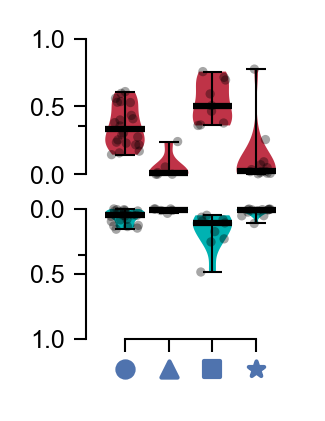

In [24]:
fig = plt.figure(figsize=[0.7, 1.0])
ax1 = fig.add_axes([0, 0.525, 1, 0.475])
dvs.plots.plt_utils.rm_spines(ax1, spines=("bottom",))
ax2 = fig.add_axes([0, 0, 1, 0.475])

scatter_edge_width = 1
scatter_edge_color = "none"
scatter_face_color = "k"
scatter_alpha = 0.35
scatter_all_marker = "o"


dvs.plots.violin_groups(
    np.array(dsis_on)[:, None],
    #                          figsize=[0.7, 1],
    fontsize=6,
    width=0.9,
    scatter=False,
    colors=(dvs.utils.color_utils.ON,),
    scatter_radius=0.2,
    violin_alpha=0.8,
    fig=fig,
    ax=ax1,
    mean_median_linewidth=1.5,
    mean_median_color="k",  # "#FF7276", #"white",
    mean_median_bar_length=1.0,
)


ax1.grid(False)

uniform=[-0.35, 0.35]
markers = dvs.analysis.clustering.MARKERS
for i, _dsis in enumerate(dsis_on):
    #               ax1.scatter(i, _dsis, s=15, c=color, marker=markers[i], zorder=100)
    ax1.scatter(
        np.ones(len(_dsis.flatten())) * i + np.random.uniform(*uniform, size=len(_dsis.flatten())),
        _dsis.flatten(),
        s=5,
        marker=scatter_all_marker,
        facecolor=scatter_face_color,
        edgecolor=scatter_edge_color,
        alpha=scatter_alpha,
        zorder=100,
    )

dvs.plots.violin_groups(
    np.array(dsis_off)[:, None],
    #                          figsize=[0.7, 1],
    fontsize=6,
    width=0.9,
    scatter=False,
    colors=(dvs.utils.color_utils.OFF,),
    scatter_radius=0.2,
    violin_alpha=1.0,
    fig=fig,
    ax=ax2,
    mean_median_linewidth=1.5,
    mean_median_color="k",  # "#FF7276", #"white",
    mean_median_bar_length=1.0,
)

markers = dvs.analysis.clustering.MARKERS
for i, _dsis in enumerate(dsis_off):
    #               ax1.scatter(i, _dsis, s=15, c=color, marker=markers[i], zorder=100)
    ax2.scatter(
        np.ones(len(_dsis.flatten())) * i + np.random.uniform(*uniform, size=len(_dsis.flatten())),
        _dsis.flatten(),
        s=5,
        marker=scatter_all_marker,
        facecolor=scatter_face_color,
        edgecolor=scatter_edge_color,
        alpha=scatter_alpha,
        zorder=100,
    )

ax1.set_ylim(-0.05, 1.0)
ax2.set_ylim(-0.1, 1.0)


# ax1.set_xticks([])
ax2.set_xticks([0, 1, 2, 3])

plots.plt_utils.trim_axis(ax1)
plots.plt_utils.trim_axis(ax2)

ax2.invert_yaxis()
# ax2.set_xticks([])
# ax2.set_xticks([0, 1, 2, 3], minor=True)


def add_cluster_marker(fig, ax, marker="o", marker_size=15, color="#4F73AE"):

    overlay_ax = [ax for ax in fig.axes if ax.get_label() == "overlay"]
    overlay_ax = (
        overlay_ax[0] if overlay_ax else fig.add_axes([0, 0, 1, 1], label="overlay")
    )
    overlay_ax.set_ylim(0, 1)
    overlay_ax.set_xlim(0, 1)
    left, bottom, width, height = ax.get_position().bounds

    overlay_ax.patch.set_alpha(0)
    dvs.plots.plt_utils.rm_spines(
        overlay_ax, visible=False, rm_xticks=True, rm_yticks=True
    )
    overlay_ax.scatter(left, bottom, marker=marker, s=marker_size, color=color)


tick_data_coords = np.vstack((ax2.get_xticks(minor=False), np.ones_like(ax2.get_xticks(minor=False)))).T
# from data to Figure coordinates - from figure coordinates to ax-relative coordinates
# tick_positions = ax2.transAxes.inverted().transform(ax2.transData.transform(crd))[:,0]
left, bottom, width, height = ax2.get_position().bounds
overlay_ax = fig.add_axes([left, bottom - 0.175, width, 0.15])
dvs.plots.rm_spines(overlay_ax)
overlay_ax.set_xlim(ax2.get_xlim())
overlay_ax.patch.set_alpha(0)

for cluster_id in cluster_indices:
    x, y = tick_data_coords[cluster_id]
    overlay_ax.scatter(x, y, marker=markers[cluster_id], s=15, color="#4F73AE")

ax2.set_xticklabels([" " for xticks in ax2.get_xticks()])

yticks = [0, 0.3569298612537902, 0.5, 1]
yticklabels = ["0.0", "", "0.5", "1.0"]
yticks = [0, 0.5, 1]
yticklabels = ["0.0", "0.5", "1.0"]
ax1.set_yticks(yticks, yticklabels)
ax1.set_yticks([0.3569298612537902], minor=True)
ax2.set_yticks(yticks, yticklabels)
ax2.set_yticks([0.3569298612537902], minor=True)

dvs.plots.plt_utils.set_spine_tick_params(
    ax1,
    tickwidth=0.5,
    ticklength=3,
    ticklabelpad=2,
    labelsize=6,
    spinewidth=0.5,
)

dvs.plots.plt_utils.set_spine_tick_params(
    ax2,
    tickwidth=0.5,
    ticklength=3,
    ticklabelpad=2,
    labelsize=6,
    spinewidth=0.5,
)

plt.savefig(
    dvs.figure_04_tmy3 / f"{node_type}_direction_selectivity_100percent_new.pdf",
    bbox_inches="tight",
    transparent=True,
)

In [119]:
ax2.get_xticks(minor=True)

array([], dtype=int64)

# b - motion tuning

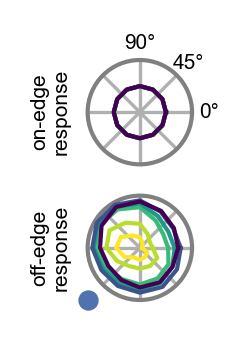

In [23]:
cluster = 0
marker = dvs.analysis.clustering.MARKERS[cluster]
with ensemble.model_items(cluster_indices[cluster]):
    with ensemble.sort(
        "min", validation_subwrap=validation_subwrap, loss_name=validation_loss_fn
    ):
        nnv = ensemble[0]

fig, axes, _, _ = nnv.motion_tuning_all(
    node_type,
    intensity=[0, 1],
    figsize=[0.5, 1.0],
    cbar_offset=(1.7, 0),
    linewidth=1,
    cmap=plt.cm.viridis_r,
    nonlinearity=True,
    cbar=False,
    anglepad=-6.5,
    subwrap=movingedge_subwrap,
)
fig.suptitle("", fontsize=5, y=1.1)
dvs.plots.plt_utils.add_cluster_marker(fig, axes[1, 0], marker=marker)
axes[1, 0].set_xticklabels([])
plt.savefig(dvs.figure_04_tmy3 / f"{node_type}_cluster_{cluster+1}_model_1_onoff.pdf", bbox_inches="tight", transparent=True)

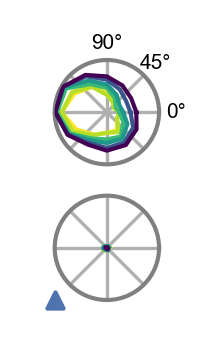

In [29]:
cluster = 1
marker = dvs.analysis.clustering.MARKERS[cluster]
with ensemble.model_items(cluster_indices[cluster]):
    with ensemble.sort(
        "min", validation_subwrap=validation_subwrap, loss_name=validation_loss_fn
    ):
        nnv = ensemble[0]

fig, axes, _, _ = nnv.motion_tuning_all(
    node_type,
    intensity=[0, 1],
    figsize=[0.5, 1.0],
    cbar_offset=(1.7, 0),
    linewidth=1,
    cmap=plt.cm.viridis_r,
    nonlinearity=True,
    cbar=False,
    anglepad=-6.5,
    subwrap=movingedge_subwrap,
)
fig.suptitle("", fontsize=5, y=1.1)
dvs.plots.plt_utils.add_cluster_marker(fig, axes[1, 0], marker=marker)
axes[1, 0].set_xticklabels([])
axes[0, 0].set_ylabel("")
axes[1, 0].set_ylabel("")
plt.savefig(dvs.figure_04_tmy3 / f"{node_type}_cluster_{cluster+1}_model_1_onoff.pdf", bbox_inches="tight", transparent=True)

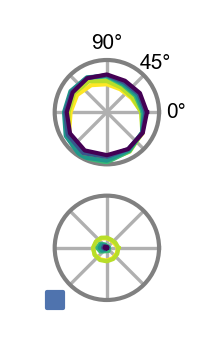

In [30]:
cluster = 2
marker = dvs.analysis.clustering.MARKERS[cluster]
with ensemble.model_items(cluster_indices[cluster]):
    with ensemble.sort(
        "min", validation_subwrap=validation_subwrap, loss_name=validation_loss_fn
    ):
        nnv = ensemble[0]

fig, axes, _, _ = nnv.motion_tuning_all(
    node_type,
    intensity=[0, 1],
    figsize=[0.5, 1.0],
    cbar_offset=(1.7, 0),
    linewidth=1,
    cmap=plt.cm.viridis_r,
    nonlinearity=True,
    cbar=False,
    anglepad=-6.5,
    subwrap=movingedge_subwrap,
)
fig.suptitle("", fontsize=5, y=1.1)
dvs.plots.plt_utils.add_cluster_marker(fig, axes[1, 0], marker=marker)
axes[1, 0].set_xticklabels([])
axes[0, 0].set_ylabel("")
axes[1, 0].set_ylabel("")
plt.savefig(dvs.figure_04_tmy3 / f"{node_type}_cluster_{cluster+1}_model_1_onoff.pdf", bbox_inches="tight", transparent=True)

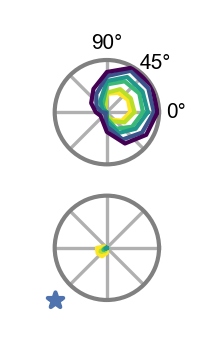

In [31]:
cluster = 3
marker = dvs.analysis.clustering.MARKERS[cluster]
with ensemble.model_items(cluster_indices[cluster]):
    with ensemble.sort(
        "min", validation_subwrap=validation_subwrap, loss_name=validation_loss_fn
    ):
        nnv = ensemble[0]

fig, axes, _, _ = nnv.motion_tuning_all(
    node_type,
    intensity=[0, 1],
    figsize=[0.5, 1.0],
    cbar_offset=(1.7, 0),
    linewidth=1,
    cmap=plt.cm.viridis_r,
    nonlinearity=True,
    cbar=False,
    anglepad=-6.5,
    subwrap=movingedge_subwrap,
)
fig.suptitle("", fontsize=5, y=1.1)
dvs.plots.plt_utils.add_cluster_marker(fig, axes[1, 0], marker=marker)
axes[1, 0].set_xticklabels([])
axes[0, 0].set_ylabel("")
axes[1, 0].set_ylabel("")
plt.savefig(dvs.figure_04_tmy3 / f"{node_type}_cluster_{cluster+1}_model_1_onoff.pdf", bbox_inches="tight", transparent=True)

# c - filters

In [14]:
mpl.rcParams['figure.dpi'] = 300

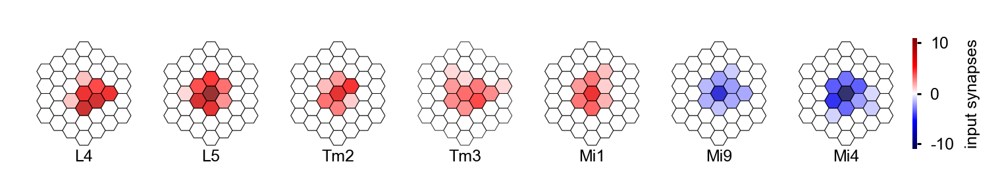

In [430]:
u = [0, 1, 2, 3, 4, 5, 6]
v = [0, 0, 0, 0, 0, 0, 0]

# u_ax_title = -2.3
# v_ax_title = -2.3

u_ax_title = 0 #-3.5
v_ax_title = 3.5 #-3.5

x_ax_title, y_ax_title = dvs.utils.hex_to_pixel(u_ax_title, v_ax_title)

x_ax_title = 0
y_ax_title = -7.5 # - 10

x, y = dvs.utils.hex_to_pixel(u, v, mode="pointy")
x += 0.1
y += 0.1

# [3.65, 1]

fig, axes, pos = dvs.plots.regular_ax_scatter(
    x,
    y,
    figsize=[5.333, 1], #[8, 1.5],
    hpad=0,
    wpad=0.0,
    wspace=-2.15,
    hspace=-0.5,
)
sources = ["L4", "L5", "Tm2", "Tm3", "Mi1", "Mi9", "Mi4"]
fig, axes, (vmin, vmax) = nnv.receptive_fields_grid(
    "TmY3",
    sources=sources,
    sort_alphabetically=False,
    fontsize=6,
    cbar=False,
    max_extent=3,
    ax_titles="",
    fig=fig,
    axes=axes,
    annotate=False,
    edgewidth=0.25
)
for i, ax in enumerate(axes):
    ax.annotate(
        sources[i],
        (x_ax_title, y_ax_title),
        xycoords="data",
        ha="center",
        va="center",
        fontsize=6,
    )
    
cmap = plt.cm.seismic
norm = dvs.plots.plt_utils.get_norm(vmin=vmin, vmax=vmax, midpoint=0)
dvs.plots.plt_utils.add_colorbar_to_fig(
    fig,
    width=0.005,
    height=0.75,
    fontsize=6,
    cmap=cmap,
    norm=norm,
    label="input synapses",
    ticks=[-10, 0, 10],
    n_decimals=0
)    
    
plt.savefig(dvs.figure_04_tmy3 / f"major_inputs_L4_L5_Mi1_Mi4_Mi9_Tm2_Tm3_horizontal.pdf", bbox_inches="tight", transparent=True)

In [439]:
dict(sorted(nnv.receptive_fields_sum("TmY3").items(), key=lambda x: x[1], reverse=True))

{'L5': 42.448807,
 'Mi4': 39.36667,
 'L4': 36.264286,
 'Tm3': 26.694445,
 'Tm2': 25.229134,
 'Mi1': 24.991665,
 'Mi9': 23.558334,
 'Tm4': 10.053571,
 'L2': 9.433333,
 'TmY15': 7.166667,
 'TmY5a': 4.366667,
 'Mi14': 1.6666666,
 'Tm16': 1.3333334,
 'Mi10': 1.0,
 'TmY3': 1.0}

In [440]:
cell_types = ["L1", "L2", "L3", "L4", "L5", "Tm2", "Tm3", "Mi1", "Mi9", "Mi4", "TmY3"]

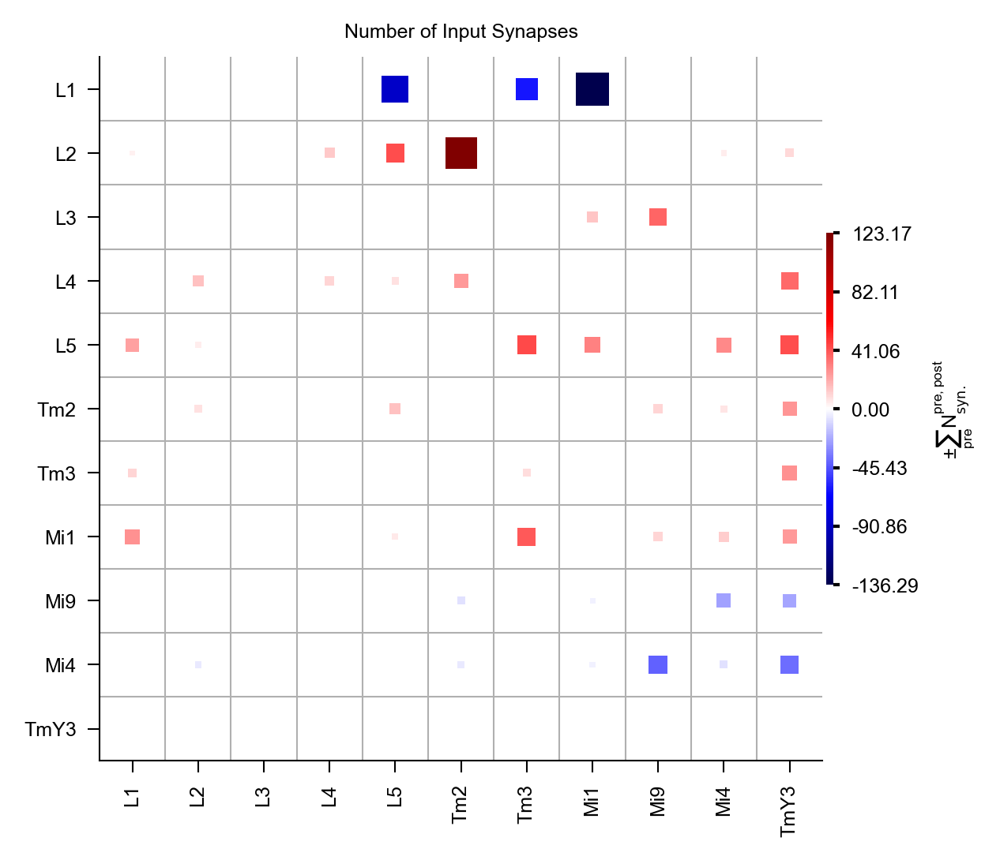

In [441]:
fig, ax, cbar, matrix = nnv.connectivity_matrix(
    "n_syn",
    node_types=cell_types,
    figsize=dvs.plots.cm_to_inch(10, 10),
    fontsize=fontsize,
    size_scale=0.75,
    min_number=2.5,
    no_symlog=True,
)
_ = dvs.plots.plt_utils.patch_type_texts(ax)

In [418]:
nnv = ensemble[1]

(<Figure size 300x300 with 1 Axes>,
 <PolarAxesSubplot: xlabel='DSI: 0.23, PD: 180'>)

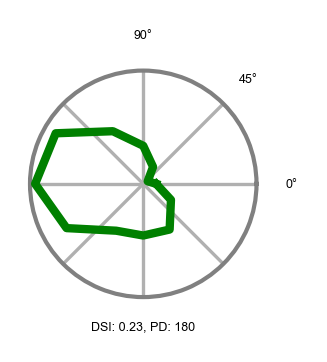

In [445]:
nnv.motion_tuning("TmY3", intensity=1, figsize=[1, 1], fontsize=3)

01/20/2023 05:15:20 AM - Computing 1 stimulus responses.


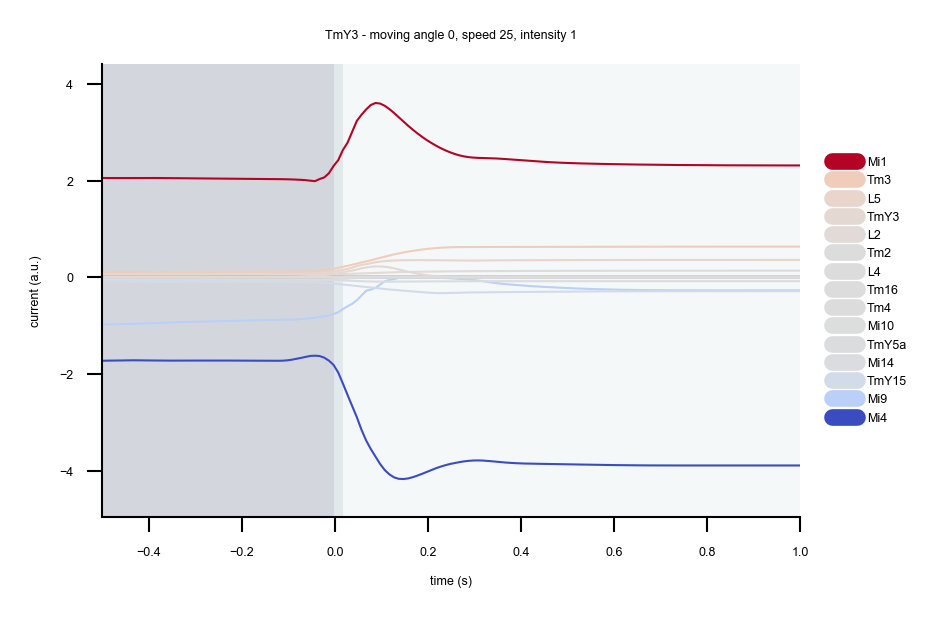

In [446]:
_ = nnv.movingbar_inputs("TmY3", angle=0, width=80, intensity=1, speed=25, figsize=[3, 2], fontsize=3)

01/20/2023 05:15:28 AM - Computing 1 stimulus responses.


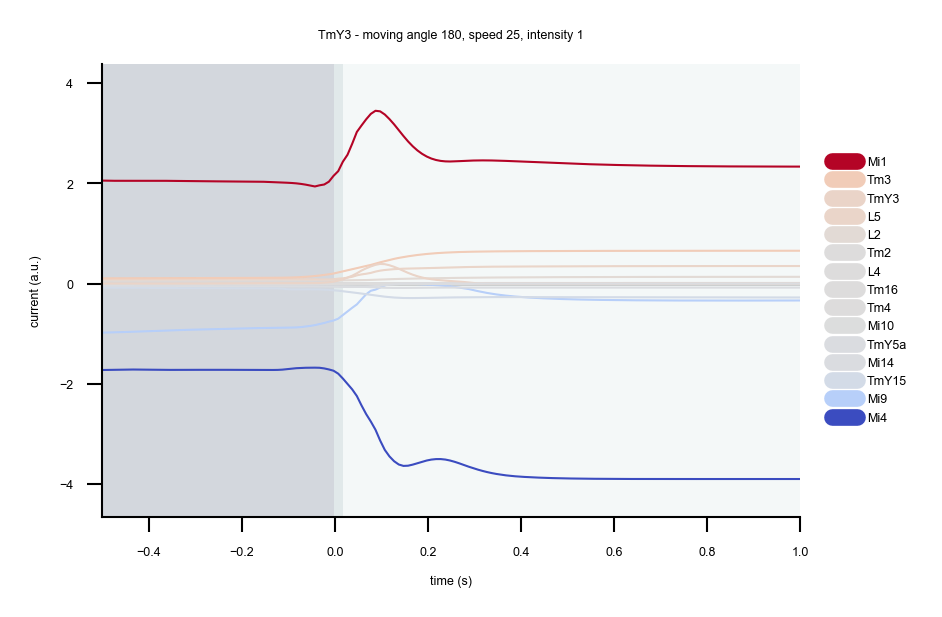

In [447]:
_ = nnv.movingbar_inputs("TmY3", angle=180, width=80, intensity=1, speed=25, figsize=[3, 2], fontsize=3)

In [653]:
axes

{0.0: <AxesSubplot: >,
 1.0: <AxesSubplot: >,
 2.0: <AxesSubplot: >,
 3.0: <AxesSubplot: >,
 4.0: <AxesSubplot: >,
 5.0: <AxesSubplot: >,
 6.0: <AxesSubplot: >}

In [657]:
dvs.plots.plt_utils.cm_to_inch([4.5, 3.5])

(1.7716535433070866, 1.3779527559055118)

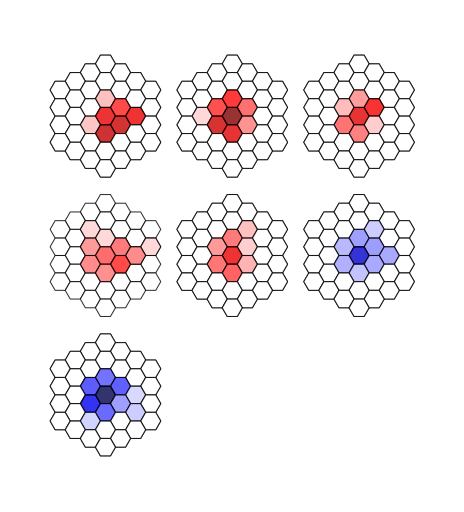

In [680]:
# u = [0, 1, 2, 3, 4, 5, 6]
# v = [0, 0, 0, 0, 0, 0, 0]

# # u_ax_title = -2.3
# # v_ax_title = -2.3

# u_ax_title = 0 #-3.5
# v_ax_title = 3.5 #-3.5

# x_ax_title, y_ax_title = dvs.utils.hex_to_pixel(u_ax_title, v_ax_title)

# x_ax_title = 0
# y_ax_title = -7.5 # - 10

# x, y = dvs.utils.hex_to_pixel(u, v, mode="pointy")
# x += 0.1
# y += 0.1

# x = [1.1, 0.1, 1.1, 0.1, 1.1, 0.1, 1.1]
# y = [3.1, 3.1, 2.1, 2.1, 1.1, 1.1, 0.1]
# # [3.65, 1]

# fig, axes, pos = dvs.plots.regular_ax_scatter(
#     x,
#     y,
#     figsize=[5.333, 1], #[8, 1.5],
#     hpad=0,
#     wpad=0.0,
#     wspace=-2.15,
#     hspace=-0.5,
# )

fig, axes = dvs.plots.divide_figure_to_grid(
    matrix=[[0, 1, 2], [3, 4, 5], [6, np.nan, np.nan]], 
    wspace=-0.4, 
    hspace=-0.2, 
    figsize=[2, 2.]
)

sources = ["L4", "L5", "Tm2", "Tm3", "Mi1", "Mi9", "Mi4"]
fig, axes, (vmin, vmax) = nnv.receptive_fields_grid(
    "TmY3",
    sources=sources,
    sort_alphabetically=False,
    fontsize=6,
    cbar=False,
    max_extent=3,
    ax_titles="",
    fig=fig,
    axes=axes,
    annotate=False,
    edgewidth=0.25,
)
# for i, source_type in enumerate(sources):
#     if source_type == "CT1M10":
#         source_type = "CT1(M10)"
#     axes[i].annotate(
#         source_type,
#         (x_ax_title, y_ax_title),
#         xycoords="data",
#         ha="center",
#         va="center",
#         fontsize=6,
#     )

cmap = plt.cm.seismic
norm = dvs.plots.plt_utils.get_norm(vmin=vmin, vmax=vmax, midpoint=0)
# dvs.plots.plt_utils.add_colorbar_to_fig(
#     fig,
#     width=0.025,
#     height=0.5,
#     fontsize=6,
#     cmap=cmap,
#     norm=norm,
#     label="input synapses",
#     ticks=[-10, 0, 10],
#     n_decimals=0,
#     pos=""
# )
plt.savefig(dvs.figure_04_tmy3 / f"major_inputs_L4_L5_Mi1_Mi4_Mi9_Tm2_Tm3_grid.pdf", bbox_inches="tight", transparent=True)

(<Figure size 120x30 with 1 Axes>,
 <matplotlib.colorbar.Colorbar at 0x7f4ae1eb94e0>)

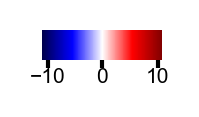

In [672]:
dvs.plots.standalone_colorbar(cmap, norm, orientation="horizontal",
                              figsize=[0.4, 0.1])

# fri per cluster

In [26]:
cluster_indices = ensemble.cluster_indices(
    "TmY3",
    naturalistic_responses_wrap=naturalistic_responses_wrap,
#     color_mask=~model_mask,
    validation_subwrap=validation_subwrap,
    loss_name=validation_loss_fn,
    embedding_kwargs=embedding_kwargs,
)

In [27]:
on_pathway = dvs.utils.nodes_edges_utils.nodes_list_sorting_on_off_unknown()

In [28]:
pathway = ["L4", "L5", "Tm2", "Tm3", "Mi1", "Mi9", "Mi4"]

In [29]:
directory

PosixPath('/groups/turaga/home/lappalainenj/FlyVis/dvs-sim/data/figures/manuscript/figure_04_tmy/assets/links')

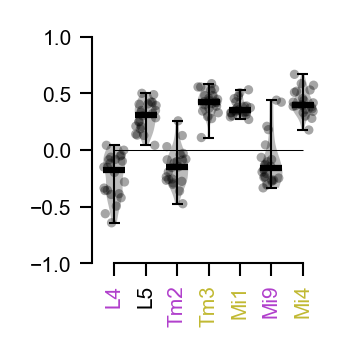

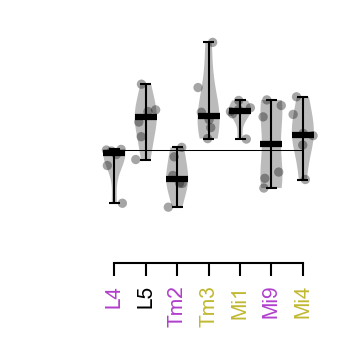

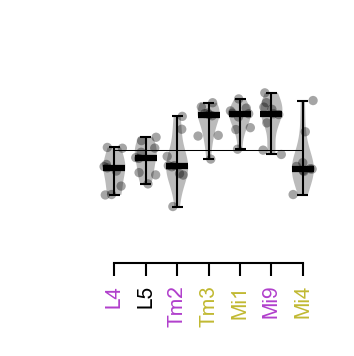

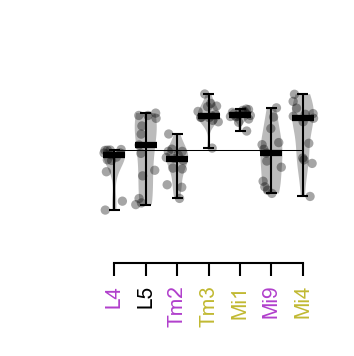

In [30]:
# fig, axes, _ = dvs.plots.get_axis_grid(gridwidth = len(cluster_indices), gridheight=1, figsize=[1.13* len(cluster_indices), 0.83])
MARKERS = dvs.analysis.clustering.MARKERS

for i, indices in enumerate(cluster_indices.values()):
    with ensemble.model_items(key=indices):
        #         ensemble.plot_parameter_marginals(
        #             "nodes_time_const",
        #             max_per_ax=100,
        #             best_ratio=1,
        #             worst_ratio=1,
        #             initialization=True,
        #         )
        #         plt.show()
        fig, ax = ensemble.fris_paper_figure(
            sorted_type_list=pathway,
            cmap=plt.cm.Greys_r,
            cstart=100,
            known_first=False,
            figsize=[1, 1],
            subwrap=flash_subwrap,
            validation_subwrap=validation_subwrap,
            bold_output_type_labels=False,
            color_known_types=True,
            scatter_best=False,
            fontsize=5,
            scatter_edge_width=1,
            scatter_best_edge_width=0.75,
            scatter_edge_color="none",
            scatter_face_color="k",
            scatter_alpha=0.35,
            scatter_best_alpha=1.0,
            scatter_all_marker="o",
            scatter_best_marker="o",
            scatter_best_color=None,
            mean_median_linewidth=1.5,
            mean_median_color="k",  # "#FF7276", #"white",
            mean_median_bar_length=1.0,
#             fig=fig,
#             ax=axes[i]
        )
        if i > 0:
#             dvs.plots.rm_spines(ax, spines=("left",))
            ax.spines['left'].set_color('none')
#             ax.spines['top'].set_color('red')
            ax.yaxis.label.set_color('none')
            ax.tick_params(axis='y', colors='none')
        #         dvs.plots.plt_utils.boldify_labels(["Mi4", "Mi9"], ax)
        plt.savefig(
            directory
            / f"cluster_{i}_fris_larger.pdf",
            bbox_inches="tight",
            transparent=True,
        )
        plt.show()
#         dvs.plots.plt_utils.add_cluster_marker(fig, axes[i], marker=MARKERS[i])
# for i in range(len(cluster_indices)):
    

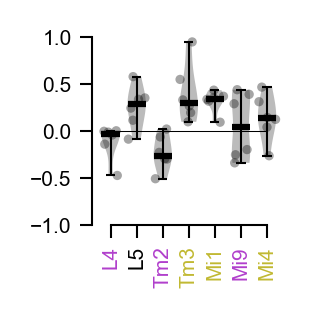

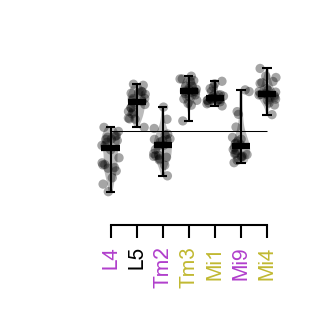

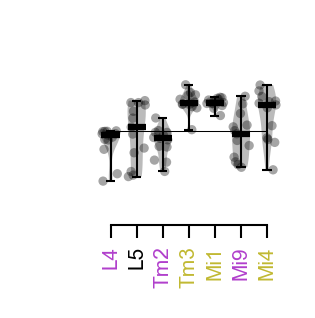

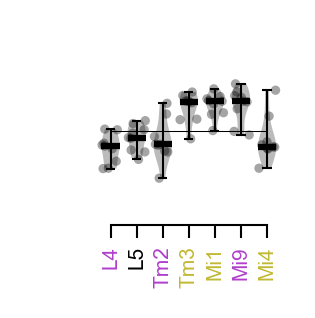

In [635]:
# fig, axes, _ = dvs.plots.get_axis_grid(gridwidth = len(cluster_indices), gridheight=1, figsize=[1.13* len(cluster_indices), 0.83])
MARKERS = dvs.analysis.clustering.MARKERS

for i, indices in enumerate(cluster_indices.values()):
    with ensemble.model_items(key=indices):
        #         ensemble.plot_parameter_marginals(
        #             "nodes_time_const",
        #             max_per_ax=100,
        #             best_ratio=1,
        #             worst_ratio=1,
        #             initialization=True,
        #         )
        #         plt.show()
        fig, ax = ensemble.fris_paper_figure(
            sorted_type_list=pathway,
            cmap=plt.cm.Greys_r,
            cstart=100,
            known_first=False,
            figsize=[0.83, 0.83],
            subwrap=flash_subwrap,
            validation_subwrap=validation_subwrap,
            bold_output_type_labels=False,
            color_known_types=True,
            scatter_best=False,
            fontsize=5,
            scatter_edge_width=1,
            scatter_best_edge_width=0.75,
            scatter_edge_color="none",
            scatter_face_color="k",
            scatter_alpha=0.35,
            scatter_best_alpha=1.0,
            scatter_all_marker="o",
            scatter_best_marker="o",
            scatter_best_color=None,
            mean_median_linewidth=1.5,
            mean_median_color="k",  # "#FF7276", #"white",
            mean_median_bar_length=1.0,
#             fig=fig,
#             ax=axes[i]
        )
        if i > 0:
#             dvs.plots.rm_spines(ax, spines=("left",))
            ax.spines['left'].set_color('none')
#             ax.spines['top'].set_color('red')
            ax.yaxis.label.set_color('none')
            ax.tick_params(axis='y', colors='none')
        #         dvs.plots.plt_utils.boldify_labels(["Mi4", "Mi9"], ax)
        plt.savefig(
            directory
            / f"cluster_{i}_fris.pdf",
            bbox_inches="tight",
            transparent=True,
        )
        plt.show()
#         dvs.plots.plt_utils.add_cluster_marker(fig, axes[i], marker=MARKERS[i])
# for i in range(len(cluster_indices)):
    

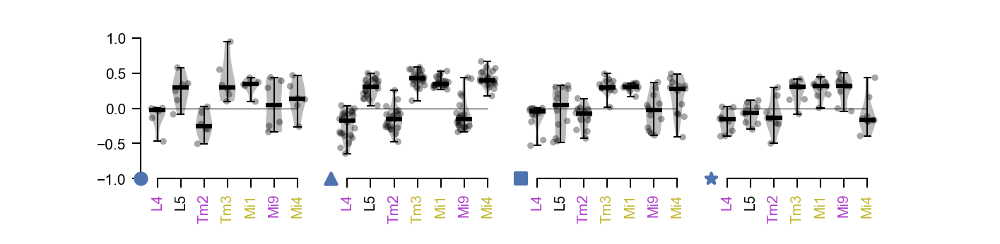

In [459]:
fig, axes, _ = dvs.plots.get_axis_grid(gridwidth = len(cluster_indices), gridheight=1, figsize=[1.13* len(cluster_indices), 0.83])
MARKERS = dvs.analysis.clustering.MARKERS

for i, indices in enumerate(cluster_indices.values()):
    with ensemble.model_items(key=indices):
        #         ensemble.plot_parameter_marginals(
        #             "nodes_time_const",
        #             max_per_ax=100,
        #             best_ratio=1,
        #             worst_ratio=1,
        #             initialization=True,
        #         )
        #         plt.show()
        fig, ax = ensemble.fris_paper_figure(
            sorted_type_list=pathway,
            cmap=plt.cm.Greys_r,
            cstart=100,
            known_first=False,
            figsize=[1.13, 0.83],
            subwrap=flash_subwrap,
            validation_subwrap=validation_subwrap,
            bold_output_type_labels=False,
            color_known_types=True,
            scatter_best=False,
            fontsize=5,
            scatter_edge_width=1,
            scatter_best_edge_width=0.75,
            scatter_edge_color="none",
            scatter_face_color="k",
            scatter_alpha=0.35,
            scatter_best_alpha=1.0,
            scatter_all_marker="o",
            scatter_best_marker="o",
            scatter_best_color=None,
            mean_median_linewidth=1.5,
            mean_median_color="k",  # "#FF7276", #"white",
            mean_median_bar_length=1.0,
            fig=fig,
            ax=axes[i]
        )
        if i > 0:
#             dvs.plots.rm_spines(ax, spines=("left",))
            ax.spines['left'].set_color('none')
#             ax.spines['top'].set_color('red')
            ax.yaxis.label.set_color('none')
            ax.tick_params(axis='y', colors='none')
        #         dvs.plots.plt_utils.boldify_labels(["Mi4", "Mi9"], ax)
#         plt.savefig(
#             directory
#             / f"cluster_{i}_fris.pdf",
#             bbox_inches="tight",
#             transparent=True,
#         )
#         plt.show()
        dvs.plots.plt_utils.add_cluster_marker(fig, axes[i], marker=MARKERS[i])
# for i in range(len(cluster_indices)):
    

(<Figure size 6000x6000 with 20 Axes>,
 {0.0: <AxesSubplot: title={'center': 'T4c :→ TmY4'}>,
  1.0: <AxesSubplot: title={'center': 'Tm1 :→ TmY4'}>,
  2.0: <AxesSubplot: title={'center': 'T5c :→ TmY4'}>,
  3.0: <AxesSubplot: title={'center': 'T4d :→ TmY4'}>,
  4.0: <AxesSubplot: title={'center': 'Tm28 :→ TmY4'}>,
  5.0: <AxesSubplot: title={'center': 'T5d :→ TmY4'}>,
  6.0: <AxesSubplot: title={'center': 'TmY4 :→ TmY4'}>,
  7.0: <AxesSubplot: title={'center': 'T2a :→ TmY4'}>,
  8.0: <AxesSubplot: title={'center': 'TmY3 :→ TmY4'}>,
  9.0: <AxesSubplot: title={'center': 'Tm4 :→ TmY4'}>,
  10.0: <AxesSubplot: title={'center': 'TmY9 :→ TmY4'}>,
  11.0: <AxesSubplot: title={'center': 'Tm9 :→ TmY4'}>,
  12.0: <AxesSubplot: title={'center': 'TmY10 :→ TmY4'}>,
  13.0: <AxesSubplot: title={'center': 'Tm2 :→ TmY4'}>,
  14.0: <AxesSubplot: title={'center': 'TmY14 :→ TmY4'}>,
  15.0: <AxesSubplot: title={'center': 'TmY5a :→ TmY4'}>,
  16.0: <AxesSubplot: title={'center': 'Mi9 :→ TmY4'}>,
  17.0: <

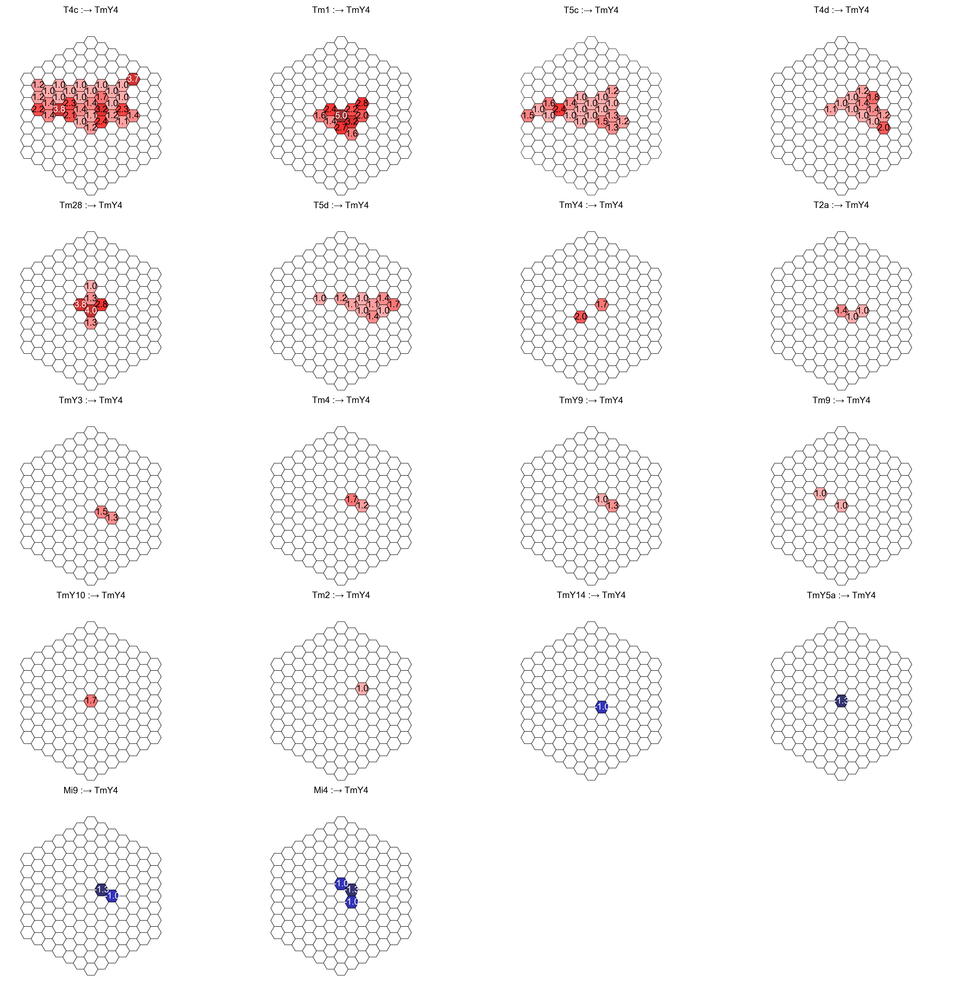

In [461]:
nnv.receptive_fields_grid("TmY4")

/groups/turaga/home/lappalainenj/FlyVis/dvs-sim/dvs/plots/decoration.py:128: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_ticklabels(new)
/groups/turaga/home/lappalainenj/FlyVis/dvs-sim/dvs/plots/decoration.py:135: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.yaxis.set_ticklabels(new)


(<Figure size 6000x6000 with 12 Axes>,
 {0.0: <AxesSubplot: title={'center': 'Tm16 :→ TmY13'}>,
  1.0: <AxesSubplot: title={'center': 'Tm2 :→ TmY13'}>,
  2.0: <AxesSubplot: title={'center': 'Tm3 :→ TmY13'}>,
  3.0: <AxesSubplot: title={'center': 'TmY3 :→ TmY13'}>,
  4.0: <AxesSubplot: title={'center': 'L5 :→ TmY13'}>,
  5.0: <AxesSubplot: title={'center': 'Tm4 :→ TmY13'}>,
  6.0: <AxesSubplot: title={'center': 'Mi1 :→ TmY13'}>,
  7.0: <AxesSubplot: title={'center': 'L4 :→ TmY13'}>,
  8.0: <AxesSubplot: title={'center': 'Mi4 :→ TmY13'}>,
  9.0: <AxesSubplot: title={'center': 'Mi9 :→ TmY13'}>},
 (-10.5, 4.0))

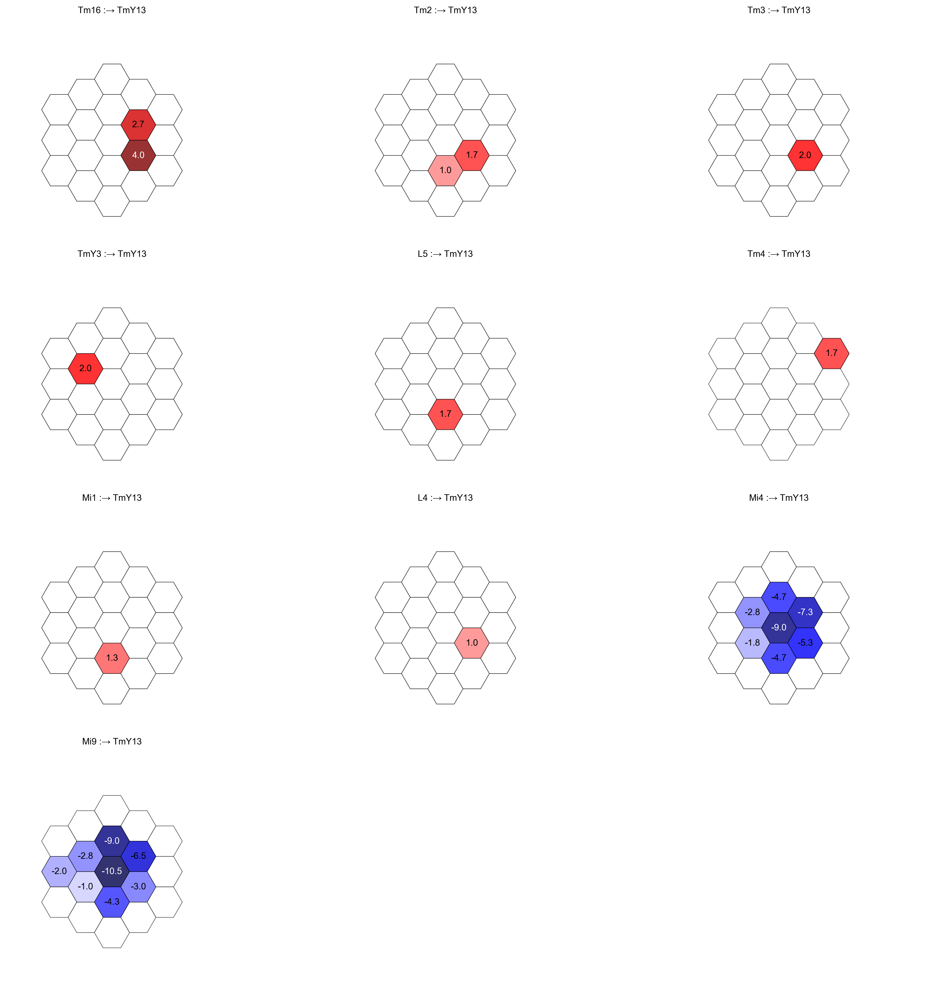

In [460]:
nnv.receptive_fields_grid("TmY13")

(<Figure size 6000x6000 with 12 Axes>,
 {0.0: <AxesSubplot: title={'center': 'Mi1 :→ TmY17'}>,
  1.0: <AxesSubplot: title={'center': 'TmY17 :→ TmY17'}>,
  2.0: <AxesSubplot: title={'center': 'Tm2 :→ TmY17'}>,
  3.0: <AxesSubplot: title={'center': 'Tm3 :→ TmY17'}>,
  4.0: <AxesSubplot: title={'center': 'T4a :→ TmY17'}>,
  5.0: <AxesSubplot: title={'center': 'L5 :→ TmY17'}>,
  6.0: <AxesSubplot: title={'center': 'TmY5a :→ TmY17'}>,
  7.0: <AxesSubplot: title={'center': 'Mi2 :→ TmY17'}>,
  8.0: <AxesSubplot: title={'center': 'Mi9 :→ TmY17'}>,
  9.0: <AxesSubplot: title={'center': 'Mi4 :→ TmY17'}>,
  10.0: <AxesSubplot: title={'center': 'TmY15 :→ TmY17'}>},
 (-4.0, 12.615385))

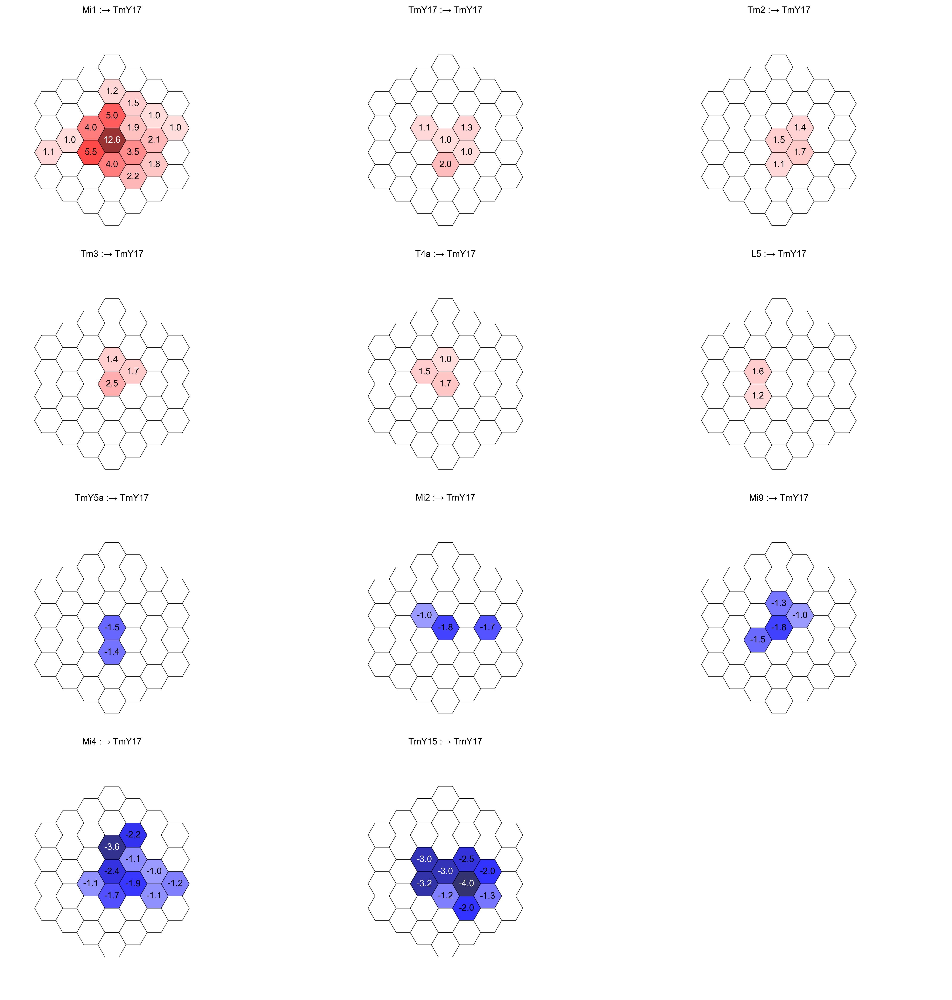

In [462]:
nnv.receptive_fields_grid("TmY17")

# speed tuning

In [12]:
ensemble.init_movingbar(movingedge_subwrap)

01/19/2023 03:55:54 PM - ValueError: stored spec (other) is not a value-matching superset of the initialized spec (self).
Diff is:
Namespace(
  self = ['+angles: [0, 30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330]'],
  other = ['-angles']
)
01/19/2023 03:55:55 PM - ValueError: stored spec (other) is not a value-matching superset of the initialized spec (self).
Diff is:
Namespace(
  self = ['+angles: [0, 30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330]'],
  other = ['-angles']
)
01/19/2023 03:55:56 PM - ValueError: stored spec (other) is not a value-matching superset of the initialized spec (self).
Diff is:
Namespace(
  self = ['+angles: [0, 30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330]'],
  other = ['-angles']
)
01/19/2023 03:55:56 PM - ValueError: stored spec (other) is not a value-matching superset of the initialized spec (self).
Diff is:
Namespace(
  self = ['+angles: [0, 30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330]'],
  other = ['-angles']
)
01/19/2023 03:55:56 

01/19/2023 03:56:02 PM - ValueError: stored spec (other) is not a value-matching superset of the initialized spec (self).
Diff is:
Namespace(
  self = ['+angles: [0, 30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330]'],
  other = ['-angles']
)
01/19/2023 03:56:02 PM - ValueError: stored spec (other) is not a value-matching superset of the initialized spec (self).
Diff is:
Namespace(
  self = ['+angles: [0, 30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330]'],
  other = ['-angles']
)
01/19/2023 03:56:03 PM - ValueError: stored spec (other) is not a value-matching superset of the initialized spec (self).
Diff is:
Namespace(
  self = ['+angles: [0, 30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330]'],
  other = ['-angles']
)
01/19/2023 03:56:03 PM - ValueError: stored spec (other) is not a value-matching superset of the initialized spec (self).
Diff is:
Namespace(
  self = ['+angles: [0, 30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330]'],
  other = ['-angles']
)
01/19/2023 03:56:03 

In [464]:
from dvs.analysis.simple_correlation import linear_model, correlation
from scipy.stats import linregress

In [465]:
cell_type="TmY3"

In [466]:
from dataclasses import dataclass

In [577]:
@dataclass
class SpeedTuning:
    R_ON: np.ndarray
    R_OFF: np.ndarray
    corr_ON: np.ndarray
    corr_OFF: np.ndarray
    pvals_ON: np.ndarray
    pvals_OFF: np.ndarray
    speeds: np.ndarray
    slope_ON: np.ndarray
    slope_OFF: np.ndarray

    def speed_tuning(self, intensity):
        if intensity == 0:
            return (1 + self.corr_OFF) / 2
        elif intensity == 1:
            return (1 + self.corr_ON) / 2
        else:
            raise ValueError()
        
    def speed_tuning_v2(self, intensity):
        
        normalizer = np.nanmax([np.abs(self.slope_OFF), np.abs(self.slope_ON)])
        if intensity == 0:
            return (1 + self.slope_OFF / normalizer) / 2
        elif intensity == 1:
            return (1 + self.slope_ON / normalizer) / 2
        else:
            raise ValueError()
            
            
    def speed_tuning_v3(self, intensity):
                
        n_models, n_angles, n_speeds = self.R_OFF.shape
        
        s_angular_ON = self.slope_ON.reshape(n_models, n_angles) * np.exp(np.radians(np.arange(0, 360, 360/n_angles)) * 1j)
        s_angular_OFF = self.slope_OFF.reshape(n_models, n_angles) * np.exp(np.radians(np.arange(0, 360, 360/n_angles)) * 1j)

        ssi_on = np.abs(np.nansum(s_angular_ON, axis=1)) / (np.nanmax([np.nansum(np.abs(s_angular_ON), axis=1), np.nansum(np.abs(s_angular_OFF), axis=1)], axis=0) + 1e-15)

        ssi_off = np.abs(np.nansum(s_angular_OFF, axis=1)) / (np.nanmax([np.nansum(np.abs(s_angular_ON), axis=1), np.nansum(np.abs(s_angular_OFF), axis=1)], axis=0) + 1e-15)

        if intensity == 0:
            return ssi_off
        elif intensity == 1:
            return ssi_on
        else:
            raise ValueError()
            
    def speed_tuning_v4(self, intensity):
        if intensity == 0:
            X = self.R_OFF
        elif intensity == 1:
            X = self.R_ON
        else:
            raise ValueError()
        
        drds = np.gradient(X, self.speeds, axis=-1)
        drds[np.isnan(drds)] = 0

#         maxs = np.max(drds, axis=(1, 2))
#         mins = np.min(drds, axis=(1, 2))

#         speed_tuning = np.zeros_like(maxs)

#         _mask = maxs > np.abs(mins)
#         speed_tuning[_mask] = maxs[_mask]

#         _mask = maxs <= np.abs(mins)
#         speed_tuning[_mask] = mins[_mask]
        return drds
        
def speed_tuning(self, cell_type):
    R_ON = []
    R_OFF = []
    for i, nnv in enumerate(ensemble.values()):

        #         dsi, pd, param_argmax, _, _ = nnv.movingbar.dsi(cell_type, intensity=1)
        #         pd_ON = dvs.utils.round_angles(pd, nnv.movingbar.angles)

        #         dsi, pd, param_argmax, _, _ = nnv.movingbar.dsi(cell_type, intensity=0)
        #         pd_OFF = dvs.utils.round_angles(pd, nnv.movingbar.angles)

        speeds = nnv.movingbar.speeds[:].tolist()

        r_peak_ON = np.nanmax(
            nnv.movingbar.response(
                cell_type, intensity=1, width=80, angle=None, speed=speeds, reshape=True
            ),
            axis=-2,
        ).squeeze()
        R_ON.append(r_peak_ON)

        r_peak_OFF = np.nanmax(
            nnv.movingbar.response(
                cell_type, intensity=0, width=80, angle=None, speed=speeds, reshape=True
            ),
            axis=-2,
        ).squeeze()
        R_OFF.append(r_peak_OFF)

    R_ON = np.array(R_ON)
    R_OFF = np.array(R_OFF)
    
    # remove outliers due to spurious activity
    on_quantile = np.quantile(R_ON.flatten(), q=0.95)
    off_quantile = np.quantile(R_OFF.flatten(), q=0.95)
    R_ON[R_ON>on_quantile] = np.nan
    R_OFF[R_OFF>on_quantile] = np.nan
    
    lm_ON = [linregress(speeds, r) for r in R_ON.reshape(-1, len(speeds))]
    lm_OFF = [linregress(speeds, r) for r in R_OFF.reshape(-1, len(speeds))]

    corr_ON = np.array([lm.rvalue for lm in lm_ON])
    pvals_ON = np.array([lm.pvalue for lm in lm_ON])
    slope_ON = np.array([lm.slope for lm in lm_ON])
    intercept_ON = np.array([lm.intercept for lm in lm_ON])

    corr_OFF = np.array([lm.rvalue for lm in lm_OFF])
    pvals_OFF = np.array([lm.pvalue for lm in lm_OFF])
    slope_OFF = np.array([lm.slope for lm in lm_OFF])
    intercept_OFF = np.array([lm.intercept for lm in lm_OFF])

#     corr_ON, pvals_ON = correlation(speeds, R_ON.reshape(-1, len(speeds)))
#     corr_OFF, pvals_OFF = correlation(speeds, R_OFF.reshape(-1, len(speeds)))
    return SpeedTuning(
        R_ON,
        R_OFF,
        corr_ON,
        corr_OFF,
        pvals_ON,
        pvals_OFF,
        np.array(speeds),
        slope_ON,
        slope_OFF,
    )

In [501]:
st = speed_tuning(ensemble, "TmY3")

<AxesSubplot: xlabel='speed tuning'>

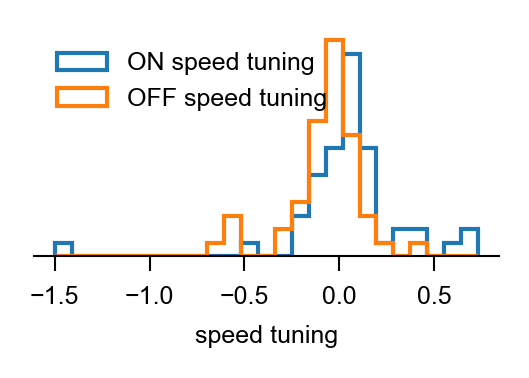

In [507]:
fontsize = 6
fig, ax = dvs.plots.init_plot(figsize=[2, 1], fontsize=fontsize)

normalizer = np.nanmax([np.abs(st.slope_OFF), np.abs(st.slope_ON)])

# bins = np.linspace(0, 1, 100)

n, bins, patches = ax.hist(
    st.speed_tuning_v4(1),
    bins=25,
    density=True,
    histtype="step",
    label="ON speed tuning",
)
ax.hist(
    st.speed_tuning_v4(0),
    bins=bins,
    density=True,
    histtype="step",
    label="OFF speed tuning",
)
ax.set_xlabel("speed tuning", fontsize=fontsize)

# ax.set_xticks(
#     [-1, 0, 1],
#     labels=[
#         "strong response\nto slow moving edges",
#         "no preference",
#         "strong response\nto fast moving edges",
#     ],
# )
ax.set_ylabel("")
ax.legend(fontsize=fontsize, loc="upper left")
# ax.set_xlim(-0.5, 0.5)
dvs.plots.rm_spines(ax, spines=("left",))

<AxesSubplot: xlabel='speed tuning'>

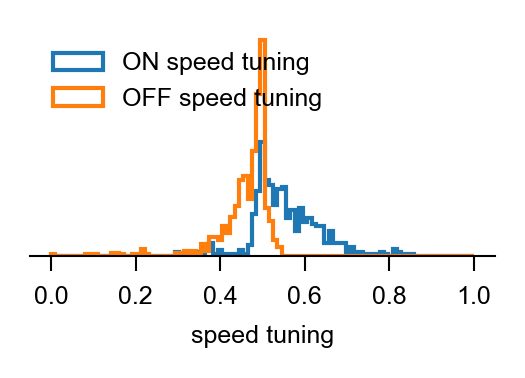

In [274]:
fontsize = 6
fig, ax = dvs.plots.init_plot(figsize=[2, 1], fontsize=fontsize)

normalizer = np.nanmax([np.abs(st.slope_OFF), np.abs(st.slope_ON)])

bins = np.linspace(0, 1, 100)

n, bins, patches = ax.hist(
    st.speed_tuning_v2(1),
    bins=bins,
    density=True,
    histtype="step",
    label="ON speed tuning",
)
ax.hist(
    st.speed_tuning_v2(0),
    bins=bins,
    density=True,
    histtype="step",
    label="OFF speed tuning",
)
ax.set_xlabel("speed tuning", fontsize=fontsize)

# ax.set_xticks(
#     [-1, 0, 1],
#     labels=[
#         "strong response\nto slow moving edges",
#         "no preference",
#         "strong response\nto fast moving edges",
#     ],
# )
ax.set_ylabel("")
ax.legend(fontsize=fontsize, loc="upper left")
# ax.set_xlim(-0.5, 0.5)
dvs.plots.rm_spines(ax, spines=("left",))

<AxesSubplot: xlabel='speed tuning'>

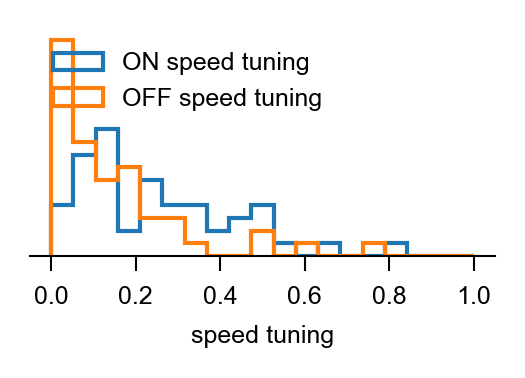

In [394]:
fontsize = 6
fig, ax = dvs.plots.init_plot(figsize=[2, 1], fontsize=fontsize)

normalizer = np.nanmax([np.abs(st.slope_OFF), np.abs(st.slope_ON)])

bins = np.linspace(0, 1, 20)

n, bins, patches = ax.hist(
    st.speed_tuning_v3(1),
    bins=bins,
    density=True,
    histtype="step",
    label="ON speed tuning",
)
ax.hist(
    st.speed_tuning_v3(0),
    bins=bins,
    density=True,
    histtype="step",
    label="OFF speed tuning",
)
ax.set_xlabel("speed tuning", fontsize=fontsize)

# ax.set_xticks(
#     [-1, 0, 1],
#     labels=[
#         "strong response\nto slow moving edges",
#         "no preference",
#         "strong response\nto fast moving edges",
#     ],
# )
ax.set_ylabel("")
ax.legend(fontsize=fontsize, loc="upper left")
# ax.set_xlim(-0.5, 0.5)
dvs.plots.rm_spines(ax, spines=("left",))

In [130]:
embedding_kwargs = dict(min_dist=0.12, spread=9.0, random_state=42)

In [403]:
cluster_indices = ensemble.cluster_indices("TmY3", 
                                           validation_subwrap=validation_subwrap, 
                                           loss_name=validation_loss_fn,
                                           naturalistic_responses_wrap=naturalistic_responses_wrap,
                                           embedding_kwargs=embedding_kwargs)

In [404]:
cluster_speed_tuning = {}
for cluster_id, indices in cluster_indices.items():
    with ensemble.model_items(indices):
        st = speed_tuning(ensemble, "TmY3")
        cluster_speed_tuning[cluster_id] = st
#         fontsize = 5
#         fig, ax = dvs.plots.init_plot(figsize=[2, 1], fontsize=fontsize)

#         n, bins, patches = ax.hist(
#             (1 + st.corr_ON) / 2, bins=50, density=True, histtype="step", label="ON speed tuning"
#         )
#         ax.hist((1 + st.corr_OFF) / 2, bins=bins, density=True, histtype="step", label="OFF speed tuning")
#         ax.set_xlabel("speed tuning", fontsize=fontsize)

#         # ax.set_xticks(
#         #     [-1, 0, 1],
#         #     labels=[
#         #         "strong response\nto slow moving edges",
#         #         "no preference",
#         #         "strong response\nto fast moving edges",
#         #     ],
#         # )
#         ax.set_ylabel("")
#         ax.legend(fontsize=fontsize, loc="upper center")
#         dvs.plots.rm_spines(ax, spines=("left",))
#         ax.set_title(f"cluster {cluster_id:02}", fontsize=fontsize)
#         plt.show()

In [290]:
st_ON = [val.speed_tuning_v2(1) for val in cluster_speed_tuning.values()]
st_OFF = [val.speed_tuning_v2(0) for val in cluster_speed_tuning.values()]

In [291]:
st_ON = [v[~np.isnan(v)] for v in st_ON]
st_OFF = [v[~np.isnan(v)] for v in st_OFF]

<ipython-input-296-589cdcb53101>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array(st_ON)[:, None],
<ipython-input-296-589cdcb53101>:48: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array(st_OFF)[:, None],


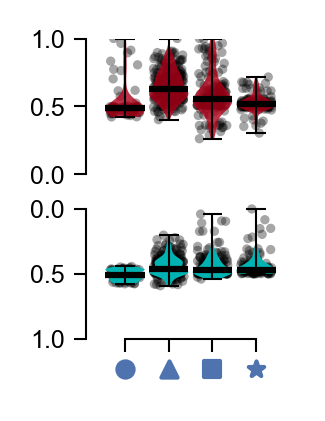

In [296]:
fig = plt.figure(figsize=[0.7, 1.0])
ax1 = fig.add_axes([0, 0.525, 1, 0.475])
dvs.plots.plt_utils.rm_spines(ax1, spines=("bottom",))
ax2 = fig.add_axes([0, 0, 1, 0.475])

scatter_edge_width = 1
scatter_edge_color = "none"
scatter_face_color = "k"
scatter_alpha = 0.35
scatter_all_marker = "o"


dvs.plots.violin_groups(
    np.array(st_ON)[:, None],
    #                          figsize=[0.7, 1],
    fontsize=6,
    width=0.9,
    scatter=False,
    colors=(dvs.utils.color_utils.ON,),
    scatter_radius=0.2,
    violin_alpha=0.8,
    fig=fig,
    ax=ax1,
    mean_median_linewidth=1.5,
    mean_median_color="k",  # "#FF7276", #"white",
    mean_median_bar_length=1.0,
)


ax1.grid(False)

uniform = [-0.35, 0.35]
markers = dvs.analysis.clustering.MARKERS
for i, _dsis in enumerate(st_ON):
    #               ax1.scatter(i, _dsis, s=15, c=color, marker=markers[i], zorder=100)
    ax1.scatter(
        np.ones(len(_dsis.flatten())) * i + np.random.uniform(*uniform, size=len(_dsis.flatten())),
        _dsis.flatten(),
        s=5,
        marker=scatter_all_marker,
        facecolor=scatter_face_color,
        edgecolor=scatter_edge_color,
        alpha=scatter_alpha,
        zorder=-1,
    )

dvs.plots.violin_groups(
    np.array(st_OFF)[:, None],
    #                          figsize=[0.7, 1],
    fontsize=6,
    width=0.9,
    scatter=False,
    colors=(dvs.utils.color_utils.OFF,),
    scatter_radius=0.2,
    violin_alpha=1.0,
    fig=fig,
    ax=ax2,
    mean_median_linewidth=1.5,
    mean_median_color="k",  # "#FF7276", #"white",
    mean_median_bar_length=1.0,
)
for i, _dsis in enumerate(st_OFF):
    #               ax1.scatter(i, _dsis, s=15, c=color, marker=markers[i], zorder=100)
    ax2.scatter(
        np.ones(len(_dsis.flatten())) * i + np.random.uniform(*uniform, size=len(_dsis.flatten())),
        _dsis.flatten(),
        s=5,
        marker=scatter_all_marker,
        facecolor=scatter_face_color,
        edgecolor=scatter_edge_color,
        alpha=scatter_alpha,
        zorder=-1,
    )

ax1.set_ylim(-0.05, 1.0)
ax2.set_ylim(-0.1, 1.0)


# ax1.set_xticks([])
ax2.set_xticks([0, 1, 2, 3])

plots.plt_utils.trim_axis(ax1)
plots.plt_utils.trim_axis(ax2)

ax2.invert_yaxis()
# ax2.set_xticks([])
# ax2.set_xticks([0, 1, 2, 3], minor=True)


def add_cluster_marker(fig, ax, marker="o", marker_size=15, color="#4F73AE"):

    overlay_ax = [ax for ax in fig.axes if ax.get_label() == "overlay"]
    overlay_ax = (
        overlay_ax[0] if overlay_ax else fig.add_axes([0, 0, 1, 1], label="overlay")
    )
    overlay_ax.set_ylim(0, 1)
    overlay_ax.set_xlim(0, 1)
    left, bottom, width, height = ax.get_position().bounds

    overlay_ax.patch.set_alpha(0)
    dvs.plots.plt_utils.rm_spines(
        overlay_ax, visible=False, rm_xticks=True, rm_yticks=True
    )
    overlay_ax.scatter(left, bottom, marker=marker, s=marker_size, color=color)


tick_data_coords = np.vstack((ax2.get_xticks(minor=False), np.ones_like(ax2.get_xticks(minor=False)))).T
# from data to Figure coordinates - from figure coordinates to ax-relative coordinates
# tick_positions = ax2.transAxes.inverted().transform(ax2.transData.transform(crd))[:,0]
left, bottom, width, height = ax2.get_position().bounds
overlay_ax = fig.add_axes([left, bottom - 0.175, width, 0.15])
dvs.plots.rm_spines(overlay_ax)
overlay_ax.set_xlim(ax2.get_xlim())
overlay_ax.patch.set_alpha(0)

for cluster_id in cluster_indices:
    x, y = tick_data_coords[cluster_id]
    overlay_ax.scatter(x, y, marker=markers[cluster_id], s=15, color="#4F73AE")

ax2.set_xticklabels([" " for xticks in ax2.get_xticks()])

# yticks = [0, 0.3569298612537902, 0.5, 1]
# yticklabels = ["0.0", "", "0.5", "1.0"]
yticks = [0, 0.5, 1]
yticklabels = ["0.0", "0.5", "1.0"]
ax1.set_yticks(yticks, yticklabels)
# ax1.set_yticks([0.3569298612537902], minor=True)
ax2.set_yticks(yticks, yticklabels)
# ax2.set_yticks([0.3569298612537902], minor=True)

dvs.plots.plt_utils.set_spine_tick_params(
    ax1,
    tickwidth=0.5,
    ticklength=3,
    ticklabelpad=2,
    labelsize=6,
    spinewidth=0.5,
)

dvs.plots.plt_utils.set_spine_tick_params(
    ax2,
    tickwidth=0.5,
    ticklength=3,
    ticklabelpad=2,
    labelsize=6,
    spinewidth=0.5,
)

# plt.savefig(
#     dvs.figure_04_tmy3 / f"{node_type}_direction_selectivity_100percent_new.pdf",
#     bbox_inches="tight",
#     transparent=True,
# )

In [301]:
st_ON = [np.nanmedian(val.speed_tuning_v2(1).reshape(-1, 12), axis=1) for val in cluster_speed_tuning.values()]
st_OFF = [np.nanmedian(val.speed_tuning_v2(0).reshape(-1, 12), axis=1) for val in cluster_speed_tuning.values()]

/home/lappalainenj@hhmi.org/miniconda3/envs/dvs/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1218: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,


In [302]:
st_ON = [v[~np.isnan(v)] for v in st_ON]
st_OFF = [v[~np.isnan(v)] for v in st_OFF]

In [317]:
ON_SSI_COLOR = plt.cm.viridis(256 - 25, alpha=0.75)
OFF_SSI_COLOR = plt.cm.viridis(125, alpha=0.75)

<ipython-input-318-a5225a5b5df6>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array(st_ON)[:, None],
<ipython-input-318-a5225a5b5df6>:48: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array(st_OFF)[:, None],


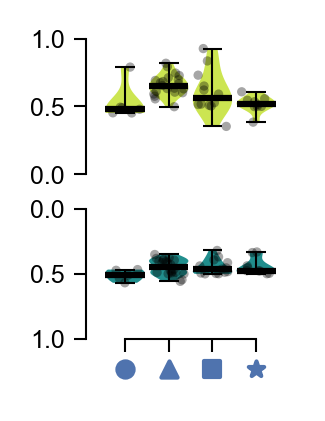

In [318]:
fig = plt.figure(figsize=[0.7, 1.0])
ax1 = fig.add_axes([0, 0.525, 1, 0.475])
dvs.plots.plt_utils.rm_spines(ax1, spines=("bottom",))
ax2 = fig.add_axes([0, 0, 1, 0.475])

scatter_edge_width = 1
scatter_edge_color = "none"
scatter_face_color = "k"
scatter_alpha = 0.35
scatter_all_marker = "o"


dvs.plots.violin_groups(
    np.array(st_ON)[:, None],
    #                          figsize=[0.7, 1],
    fontsize=6,
    width=0.9,
    scatter=False,
    colors=(ON_SSI_COLOR,),
    scatter_radius=0.2,
    violin_alpha=0.8,
    fig=fig,
    ax=ax1,
    mean_median_linewidth=1.5,
    mean_median_color="k",  # "#FF7276", #"white",
    mean_median_bar_length=1.0,
)


ax1.grid(False)

uniform = [-0.35, 0.35]
markers = dvs.analysis.clustering.MARKERS
for i, _dsis in enumerate(st_ON):
    #               ax1.scatter(i, _dsis, s=15, c=color, marker=markers[i], zorder=100)
    ax1.scatter(
        np.ones(len(_dsis.flatten())) * i + np.random.uniform(*uniform, size=len(_dsis.flatten())),
        _dsis.flatten(),
        s=5,
        marker=scatter_all_marker,
        facecolor=scatter_face_color,
        edgecolor=scatter_edge_color,
        alpha=scatter_alpha,
        zorder=10,
    )

dvs.plots.violin_groups(
    np.array(st_OFF)[:, None],
    #                          figsize=[0.7, 1],
    fontsize=6,
    width=0.9,
    scatter=False,
    colors=(OFF_SSI_COLOR,),
    scatter_radius=0.2,
    violin_alpha=1.0,
    fig=fig,
    ax=ax2,
    mean_median_linewidth=1.5,
    mean_median_color="k",  # "#FF7276", #"white",
    mean_median_bar_length=1.0,
)
for i, _dsis in enumerate(st_OFF):
    #               ax1.scatter(i, _dsis, s=15, c=color, marker=markers[i], zorder=100)
    ax2.scatter(
        np.ones(len(_dsis.flatten())) * i + np.random.uniform(*uniform, size=len(_dsis.flatten())),
        _dsis.flatten(),
        s=5,
        marker=scatter_all_marker,
        facecolor=scatter_face_color,
        edgecolor=scatter_edge_color,
        alpha=scatter_alpha,
        zorder=10,
    )

ax1.set_ylim(-0.05, 1.0)
ax2.set_ylim(-0.1, 1.0)


# ax1.set_xticks([])
ax2.set_xticks([0, 1, 2, 3])

plots.plt_utils.trim_axis(ax1)
plots.plt_utils.trim_axis(ax2)

ax2.invert_yaxis()
# ax2.set_xticks([])
# ax2.set_xticks([0, 1, 2, 3], minor=True)


def add_cluster_marker(fig, ax, marker="o", marker_size=15, color="#4F73AE"):

    overlay_ax = [ax for ax in fig.axes if ax.get_label() == "overlay"]
    overlay_ax = (
        overlay_ax[0] if overlay_ax else fig.add_axes([0, 0, 1, 1], label="overlay")
    )
    overlay_ax.set_ylim(0, 1)
    overlay_ax.set_xlim(0, 1)
    left, bottom, width, height = ax.get_position().bounds

    overlay_ax.patch.set_alpha(0)
    dvs.plots.plt_utils.rm_spines(
        overlay_ax, visible=False, rm_xticks=True, rm_yticks=True
    )
    overlay_ax.scatter(left, bottom, marker=marker, s=marker_size, color=color)


tick_data_coords = np.vstack((ax2.get_xticks(minor=False), np.ones_like(ax2.get_xticks(minor=False)))).T
# from data to Figure coordinates - from figure coordinates to ax-relative coordinates
# tick_positions = ax2.transAxes.inverted().transform(ax2.transData.transform(crd))[:,0]
left, bottom, width, height = ax2.get_position().bounds
overlay_ax = fig.add_axes([left, bottom - 0.175, width, 0.15])
dvs.plots.rm_spines(overlay_ax)
overlay_ax.set_xlim(ax2.get_xlim())
overlay_ax.patch.set_alpha(0)

for cluster_id in cluster_indices:
    x, y = tick_data_coords[cluster_id]
    overlay_ax.scatter(x, y, marker=markers[cluster_id], s=15, color="#4F73AE")

ax2.set_xticklabels([" " for xticks in ax2.get_xticks()])

# yticks = [0, 0.3569298612537902, 0.5, 1]
# yticklabels = ["0.0", "", "0.5", "1.0"]
yticks = [0, 0.5, 1]
yticklabels = ["0.0", "0.5", "1.0"]
ax1.set_yticks(yticks, yticklabels)
# ax1.set_yticks([0.3569298612537902], minor=True)
ax2.set_yticks(yticks, yticklabels)
# ax2.set_yticks([0.3569298612537902], minor=True)

dvs.plots.plt_utils.set_spine_tick_params(
    ax1,
    tickwidth=0.5,
    ticklength=3,
    ticklabelpad=2,
    labelsize=6,
    spinewidth=0.5,
)

dvs.plots.plt_utils.set_spine_tick_params(
    ax2,
    tickwidth=0.5,
    ticklength=3,
    ticklabelpad=2,
    labelsize=6,
    spinewidth=0.5,
)

plt.savefig(
    dvs.figure_04_tmy3 / f"{node_type}_speed_selectivity.pdf",
    bbox_inches="tight",
    transparent=True,
)

In [402]:
len(cluster_speed_tuning)

3

In [405]:
st_ON = [val.speed_tuning_v3(1) for val in cluster_speed_tuning.values()]
st_OFF = [val.speed_tuning_v3(0) for val in cluster_speed_tuning.values()]

In [302]:
# st_ON = [v[~np.isnan(v)] for v in st_ON]
# st_OFF = [v[~np.isnan(v)] for v in st_OFF]

In [406]:
ON_SSI_COLOR = plt.cm.viridis(256 - 25, alpha=0.75)
OFF_SSI_COLOR = plt.cm.viridis(125, alpha=0.75)

<ipython-input-407-a5225a5b5df6>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array(st_ON)[:, None],
<ipython-input-407-a5225a5b5df6>:48: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array(st_OFF)[:, None],


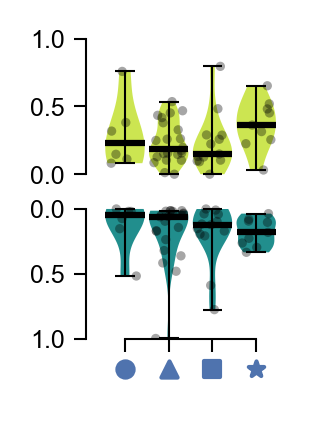

In [407]:
fig = plt.figure(figsize=[0.7, 1.0])
ax1 = fig.add_axes([0, 0.525, 1, 0.475])
dvs.plots.plt_utils.rm_spines(ax1, spines=("bottom",))
ax2 = fig.add_axes([0, 0, 1, 0.475])

scatter_edge_width = 1
scatter_edge_color = "none"
scatter_face_color = "k"
scatter_alpha = 0.35
scatter_all_marker = "o"


dvs.plots.violin_groups(
    np.array(st_ON)[:, None],
    #                          figsize=[0.7, 1],
    fontsize=6,
    width=0.9,
    scatter=False,
    colors=(ON_SSI_COLOR,),
    scatter_radius=0.2,
    violin_alpha=0.8,
    fig=fig,
    ax=ax1,
    mean_median_linewidth=1.5,
    mean_median_color="k",  # "#FF7276", #"white",
    mean_median_bar_length=1.0,
)


ax1.grid(False)

uniform = [-0.35, 0.35]
markers = dvs.analysis.clustering.MARKERS
for i, _dsis in enumerate(st_ON):
    #               ax1.scatter(i, _dsis, s=15, c=color, marker=markers[i], zorder=100)
    ax1.scatter(
        np.ones(len(_dsis.flatten())) * i + np.random.uniform(*uniform, size=len(_dsis.flatten())),
        _dsis.flatten(),
        s=5,
        marker=scatter_all_marker,
        facecolor=scatter_face_color,
        edgecolor=scatter_edge_color,
        alpha=scatter_alpha,
        zorder=10,
    )

dvs.plots.violin_groups(
    np.array(st_OFF)[:, None],
    #                          figsize=[0.7, 1],
    fontsize=6,
    width=0.9,
    scatter=False,
    colors=(OFF_SSI_COLOR,),
    scatter_radius=0.2,
    violin_alpha=1.0,
    fig=fig,
    ax=ax2,
    mean_median_linewidth=1.5,
    mean_median_color="k",  # "#FF7276", #"white",
    mean_median_bar_length=1.0,
)
for i, _dsis in enumerate(st_OFF):
    #               ax1.scatter(i, _dsis, s=15, c=color, marker=markers[i], zorder=100)
    ax2.scatter(
        np.ones(len(_dsis.flatten())) * i + np.random.uniform(*uniform, size=len(_dsis.flatten())),
        _dsis.flatten(),
        s=5,
        marker=scatter_all_marker,
        facecolor=scatter_face_color,
        edgecolor=scatter_edge_color,
        alpha=scatter_alpha,
        zorder=10,
    )

ax1.set_ylim(-0.05, 1.0)
ax2.set_ylim(-0.1, 1.0)


# ax1.set_xticks([])
ax2.set_xticks([0, 1, 2, 3])

plots.plt_utils.trim_axis(ax1)
plots.plt_utils.trim_axis(ax2)

ax2.invert_yaxis()
# ax2.set_xticks([])
# ax2.set_xticks([0, 1, 2, 3], minor=True)


def add_cluster_marker(fig, ax, marker="o", marker_size=15, color="#4F73AE"):

    overlay_ax = [ax for ax in fig.axes if ax.get_label() == "overlay"]
    overlay_ax = (
        overlay_ax[0] if overlay_ax else fig.add_axes([0, 0, 1, 1], label="overlay")
    )
    overlay_ax.set_ylim(0, 1)
    overlay_ax.set_xlim(0, 1)
    left, bottom, width, height = ax.get_position().bounds

    overlay_ax.patch.set_alpha(0)
    dvs.plots.plt_utils.rm_spines(
        overlay_ax, visible=False, rm_xticks=True, rm_yticks=True
    )
    overlay_ax.scatter(left, bottom, marker=marker, s=marker_size, color=color)


tick_data_coords = np.vstack((ax2.get_xticks(minor=False), np.ones_like(ax2.get_xticks(minor=False)))).T
# from data to Figure coordinates - from figure coordinates to ax-relative coordinates
# tick_positions = ax2.transAxes.inverted().transform(ax2.transData.transform(crd))[:,0]
left, bottom, width, height = ax2.get_position().bounds
overlay_ax = fig.add_axes([left, bottom - 0.175, width, 0.15])
dvs.plots.rm_spines(overlay_ax)
overlay_ax.set_xlim(ax2.get_xlim())
overlay_ax.patch.set_alpha(0)

for cluster_id in cluster_indices:
    x, y = tick_data_coords[cluster_id]
    overlay_ax.scatter(x, y, marker=markers[cluster_id], s=15, color="#4F73AE")

ax2.set_xticklabels([" " for xticks in ax2.get_xticks()])

# yticks = [0, 0.3569298612537902, 0.5, 1]
# yticklabels = ["0.0", "", "0.5", "1.0"]
yticks = [0, 0.5, 1]
yticklabels = ["0.0", "0.5", "1.0"]
ax1.set_yticks(yticks, yticklabels)
# ax1.set_yticks([0.3569298612537902], minor=True)
ax2.set_yticks(yticks, yticklabels)
# ax2.set_yticks([0.3569298612537902], minor=True)

dvs.plots.plt_utils.set_spine_tick_params(
    ax1,
    tickwidth=0.5,
    ticklength=3,
    ticklabelpad=2,
    labelsize=6,
    spinewidth=0.5,
)

dvs.plots.plt_utils.set_spine_tick_params(
    ax2,
    tickwidth=0.5,
    ticklength=3,
    ticklabelpad=2,
    labelsize=6,
    spinewidth=0.5,
)

plt.savefig(
    dvs.figure_04_tmy3 / f"{node_type}_speed_selectivity.pdf",
    bbox_inches="tight",
    transparent=True,
)

In [344]:
embedding_kwargs = dict(min_dist=0.12, spread=9.0, random_state=42)

In [345]:
cluster_indices = ensemble.cluster_indices("T4c", 
                                           validation_subwrap=validation_subwrap, 
                                           loss_name=validation_loss_fn,
                                           naturalistic_responses_wrap=naturalistic_responses_wrap,
                                           embedding_kwargs=embedding_kwargs)

01/19/2023 07:34:01 PM - reshaped X from (50, 4536, 80) to (50, 362880)


/home/lappalainenj@hhmi.org/miniconda3/envs/dvs/lib/python3.10/site-packages/umap/umap_.py:1356: RuntimeWarning: divide by zero encountered in power
  return 1.0 / (1.0 + a * x ** (2 * b))


In [346]:
cluster_speed_tuning = {}
for cluster_id, indices in cluster_indices.items():
    with ensemble.model_items(indices):
        st = speed_tuning(ensemble, "T4c")
        cluster_speed_tuning[cluster_id] = st
#         fontsize = 5
#         fig, ax = dvs.plots.init_plot(figsize=[2, 1], fontsize=fontsize)

#         n, bins, patches = ax.hist(
#             (1 + st.corr_ON) / 2, bins=50, density=True, histtype="step", label="ON speed tuning"
#         )
#         ax.hist((1 + st.corr_OFF) / 2, bins=bins, density=True, histtype="step", label="OFF speed tuning")
#         ax.set_xlabel("speed tuning", fontsize=fontsize)

#         # ax.set_xticks(
#         #     [-1, 0, 1],
#         #     labels=[
#         #         "strong response\nto slow moving edges",
#         #         "no preference",
#         #         "strong response\nto fast moving edges",
#         #     ],
#         # )
#         ax.set_ylabel("")
#         ax.legend(fontsize=fontsize, loc="upper center")
#         dvs.plots.rm_spines(ax, spines=("left",))
#         ax.set_title(f"cluster {cluster_id:02}", fontsize=fontsize)
#         plt.show()

In [348]:
st_ON = [np.nanmedian(val.speed_tuning_v2(1).reshape(-1, 12), axis=1) for val in cluster_speed_tuning.values()]
st_OFF = [np.nanmedian(val.speed_tuning_v2(0).reshape(-1, 12), axis=1) for val in cluster_speed_tuning.values()]

In [349]:
st_ON = [v[~np.isnan(v)] for v in st_ON]
st_OFF = [v[~np.isnan(v)] for v in st_OFF]

<ipython-input-350-647cf1868c71>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array(st_ON)[:, None],
<ipython-input-350-647cf1868c71>:48: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array(st_OFF)[:, None],


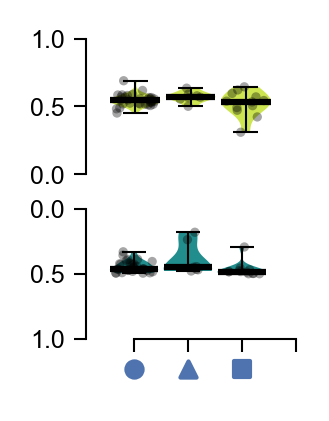

In [350]:
fig = plt.figure(figsize=[0.7, 1.0])
ax1 = fig.add_axes([0, 0.525, 1, 0.475])
dvs.plots.plt_utils.rm_spines(ax1, spines=("bottom",))
ax2 = fig.add_axes([0, 0, 1, 0.475])

scatter_edge_width = 1
scatter_edge_color = "none"
scatter_face_color = "k"
scatter_alpha = 0.35
scatter_all_marker = "o"


dvs.plots.violin_groups(
    np.array(st_ON)[:, None],
    #                          figsize=[0.7, 1],
    fontsize=6,
    width=0.9,
    scatter=False,
    colors=(ON_SSI_COLOR,),
    scatter_radius=0.2,
    violin_alpha=0.8,
    fig=fig,
    ax=ax1,
    mean_median_linewidth=1.5,
    mean_median_color="k",  # "#FF7276", #"white",
    mean_median_bar_length=1.0,
)


ax1.grid(False)

uniform = [-0.35, 0.35]
markers = dvs.analysis.clustering.MARKERS
for i, _dsis in enumerate(st_ON):
    #               ax1.scatter(i, _dsis, s=15, c=color, marker=markers[i], zorder=100)
    ax1.scatter(
        np.ones(len(_dsis.flatten())) * i + np.random.uniform(*uniform, size=len(_dsis.flatten())),
        _dsis.flatten(),
        s=5,
        marker=scatter_all_marker,
        facecolor=scatter_face_color,
        edgecolor=scatter_edge_color,
        alpha=scatter_alpha,
        zorder=10,
    )

dvs.plots.violin_groups(
    np.array(st_OFF)[:, None],
    #                          figsize=[0.7, 1],
    fontsize=6,
    width=0.9,
    scatter=False,
    colors=(OFF_SSI_COLOR,),
    scatter_radius=0.2,
    violin_alpha=1.0,
    fig=fig,
    ax=ax2,
    mean_median_linewidth=1.5,
    mean_median_color="k",  # "#FF7276", #"white",
    mean_median_bar_length=1.0,
)
for i, _dsis in enumerate(st_OFF):
    #               ax1.scatter(i, _dsis, s=15, c=color, marker=markers[i], zorder=100)
    ax2.scatter(
        np.ones(len(_dsis.flatten())) * i + np.random.uniform(*uniform, size=len(_dsis.flatten())),
        _dsis.flatten(),
        s=5,
        marker=scatter_all_marker,
        facecolor=scatter_face_color,
        edgecolor=scatter_edge_color,
        alpha=scatter_alpha,
        zorder=10,
    )

ax1.set_ylim(-0.05, 1.0)
ax2.set_ylim(-0.1, 1.0)


# ax1.set_xticks([])
ax2.set_xticks([0, 1, 2, 3])

plots.plt_utils.trim_axis(ax1)
plots.plt_utils.trim_axis(ax2)

ax2.invert_yaxis()
# ax2.set_xticks([])
# ax2.set_xticks([0, 1, 2, 3], minor=True)


def add_cluster_marker(fig, ax, marker="o", marker_size=15, color="#4F73AE"):

    overlay_ax = [ax for ax in fig.axes if ax.get_label() == "overlay"]
    overlay_ax = (
        overlay_ax[0] if overlay_ax else fig.add_axes([0, 0, 1, 1], label="overlay")
    )
    overlay_ax.set_ylim(0, 1)
    overlay_ax.set_xlim(0, 1)
    left, bottom, width, height = ax.get_position().bounds

    overlay_ax.patch.set_alpha(0)
    dvs.plots.plt_utils.rm_spines(
        overlay_ax, visible=False, rm_xticks=True, rm_yticks=True
    )
    overlay_ax.scatter(left, bottom, marker=marker, s=marker_size, color=color)


tick_data_coords = np.vstack((ax2.get_xticks(minor=False), np.ones_like(ax2.get_xticks(minor=False)))).T
# from data to Figure coordinates - from figure coordinates to ax-relative coordinates
# tick_positions = ax2.transAxes.inverted().transform(ax2.transData.transform(crd))[:,0]
left, bottom, width, height = ax2.get_position().bounds
overlay_ax = fig.add_axes([left, bottom - 0.175, width, 0.15])
dvs.plots.rm_spines(overlay_ax)
overlay_ax.set_xlim(ax2.get_xlim())
overlay_ax.patch.set_alpha(0)

for cluster_id in cluster_indices:
    x, y = tick_data_coords[cluster_id]
    overlay_ax.scatter(x, y, marker=markers[cluster_id], s=15, color="#4F73AE")

ax2.set_xticklabels([" " for xticks in ax2.get_xticks()])

# yticks = [0, 0.3569298612537902, 0.5, 1]
# yticklabels = ["0.0", "", "0.5", "1.0"]
yticks = [0, 0.5, 1]
yticklabels = ["0.0", "0.5", "1.0"]
ax1.set_yticks(yticks, yticklabels)
# ax1.set_yticks([0.3569298612537902], minor=True)
ax2.set_yticks(yticks, yticklabels)
# ax2.set_yticks([0.3569298612537902], minor=True)

dvs.plots.plt_utils.set_spine_tick_params(
    ax1,
    tickwidth=0.5,
    ticklength=3,
    ticklabelpad=2,
    labelsize=6,
    spinewidth=0.5,
)

dvs.plots.plt_utils.set_spine_tick_params(
    ax2,
    tickwidth=0.5,
    ticklength=3,
    ticklabelpad=2,
    labelsize=6,
    spinewidth=0.5,
)


In [578]:
st_on=[]
st_off=[]
for cell_type in ensemble.node_types_sorted:
    st = speed_tuning(ensemble, cell_type)
    st_on.append(st.speed_tuning_v4(1))
    st_off.append(st.speed_tuning_v4(0))
    
st_on=np.array(st_on).T
st_off=np.array(st_off).T

In [609]:
lower_on, upper_on = np.percentile(st_on.flatten(), [5, 95])
st_on_99 = np.ma.masked_where((st_on < lower_on) | (st_on > upper_on), st_on)

In [610]:
lower_off, upper_off = np.percentile(st_off.flatten(), [5, 95])
st_off_99 = np.ma.masked_where((st_off < lower_off) | (st_off > upper_off), st_off)

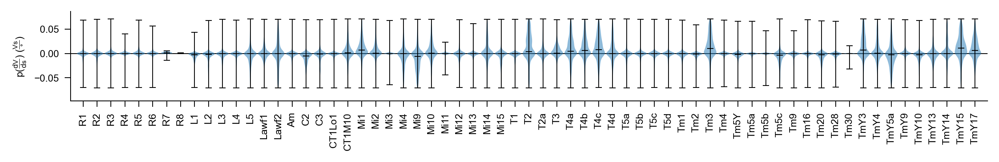

In [633]:
fig, ax, _ = dvs.plots.violin_groups(
    st_on_99.reshape(-1, 65).T[:, None], xticklabels=ensemble.node_types_sorted,
    scatter=False,
    width=0.9
)
ax.set_ylim(*dvs.plots.get_lims((lower_on, upper_on, lower_off, upper_off), 0.1))
ax.set_ylabel(r"$p(\frac{\mathrm{d}V}{\mathrm{d}s})$ ($\frac{Vs}{\circ}$)")
ax.hlines(0, *ax.get_xlim(), linewidth=0.5, zorder=-1, color="k")

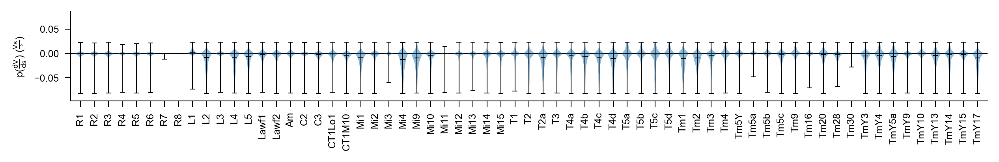

In [634]:
fig, ax, _ = dvs.plots.violin_groups(st_off_99.reshape(-1, 65).T[:, None],
                                     xticklabels=ensemble.node_types_sorted,
                                     scatter=False)
ax.set_ylim(*dvs.plots.get_lims((lower_on, upper_on, lower_off, upper_off), 0.1))
# ax.set_ylim(lower_off, upper_off)
ax.set_ylabel(r"$p(\frac{\mathrm{d}V}{\mathrm{d}s})$ ($\frac{Vs}{\circ}$)")
ax.hlines(0, *ax.get_xlim(), linewidth=0.5, zorder=-1, color="k")

In [369]:
st_on[np.isnan(st_on)] = 0.5

In [370]:
st_off[np.isnan(st_off)] = 0.5

(<Figure size 3000x300 with 1 Axes>, <AxesSubplot: >)

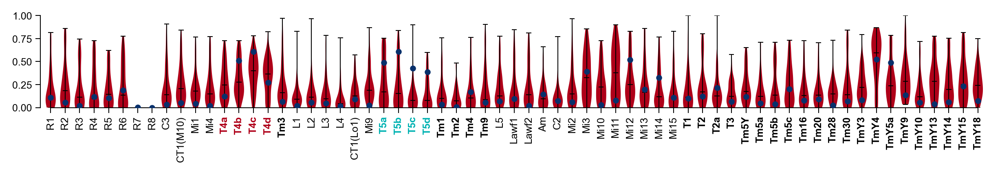

In [409]:
ensemble.dsis_paper_figure([1], subwrap=movingedge_subwrap, dsis=st_on, node_types=ensemble.node_types_sorted)

(<Figure size 3000x300 with 1 Axes>, <AxesSubplot: >)

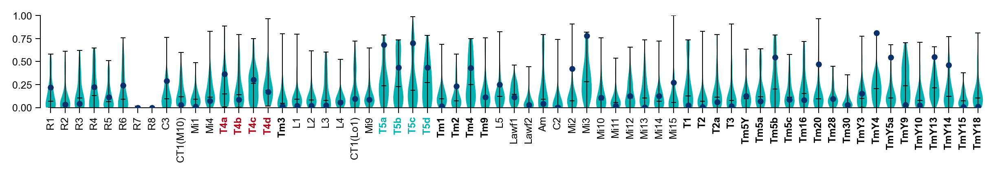

In [410]:
ensemble.dsis_paper_figure([0], subwrap=movingedge_subwrap, dsis=st_off, node_types=ensemble.node_types_sorted)

# circuit diagram

/groups/turaga/home/lappalainenj/FlyVis/dvs-sim/dvs/plots/decoration.py:128: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_ticklabels(new)
/groups/turaga/home/lappalainenj/FlyVis/dvs-sim/dvs/plots/decoration.py:135: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.yaxis.set_ticklabels(new)


(<Figure size 6000x6000 with 16 Axes>,
 {0.0: <AxesSubplot: title={'center': 'L5 :→ TmY3'}>,
  1.0: <AxesSubplot: title={'center': 'L4 :→ TmY3'}>,
  2.0: <AxesSubplot: title={'center': 'Tm3 :→ TmY3'}>,
  3.0: <AxesSubplot: title={'center': 'Tm2 :→ TmY3'}>,
  4.0: <AxesSubplot: title={'center': 'Mi1 :→ TmY3'}>,
  5.0: <AxesSubplot: title={'center': 'Tm4 :→ TmY3'}>,
  6.0: <AxesSubplot: title={'center': 'L2 :→ TmY3'}>,
  7.0: <AxesSubplot: title={'center': 'Tm16 :→ TmY3'}>,
  8.0: <AxesSubplot: title={'center': 'TmY3 :→ TmY3'}>,
  9.0: <AxesSubplot: title={'center': 'Mi10 :→ TmY3'}>,
  10.0: <AxesSubplot: title={'center': 'Mi14 :→ TmY3'}>,
  11.0: <AxesSubplot: title={'center': 'TmY5a :→ TmY3'}>,
  12.0: <AxesSubplot: title={'center': 'TmY15 :→ TmY3'}>,
  13.0: <AxesSubplot: title={'center': 'Mi9 :→ TmY3'}>,
  14.0: <AxesSubplot: title={'center': 'Mi4 :→ TmY3'}>},
 (-11.0, 10.857142))

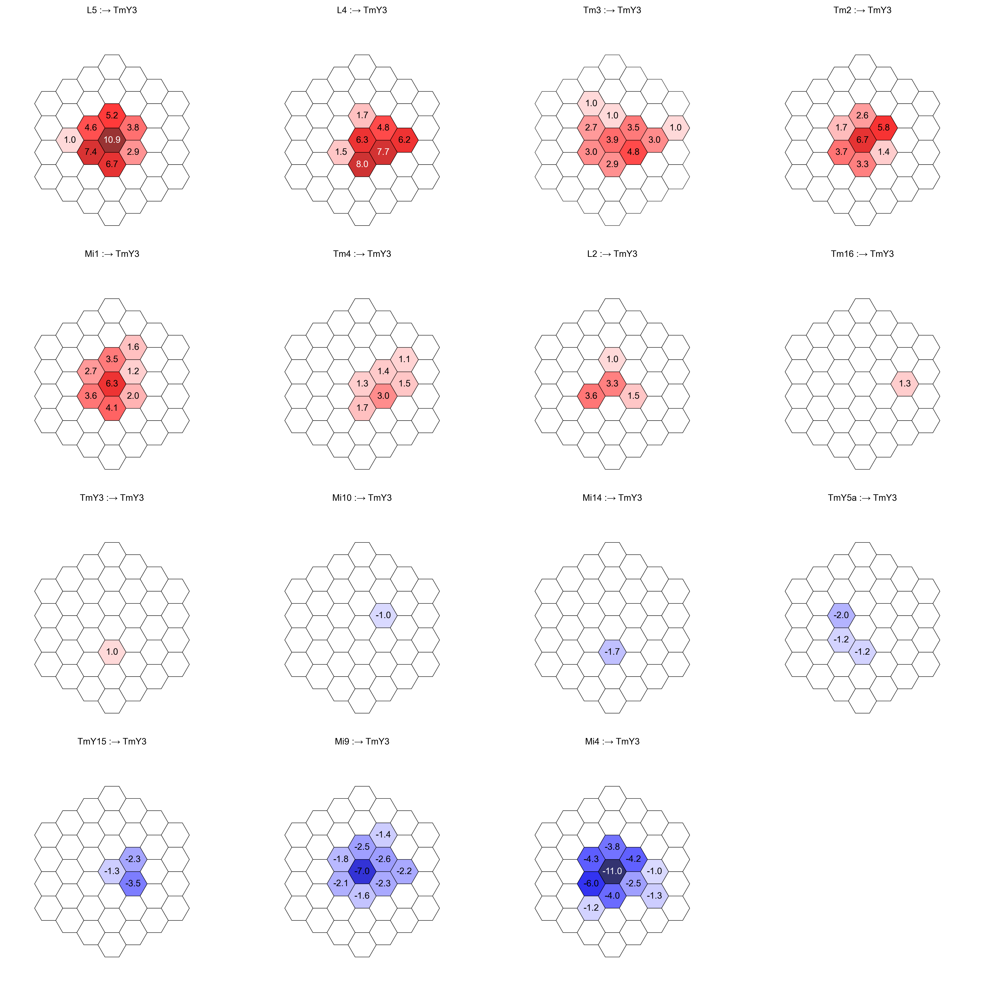

In [412]:
nnv.receptive_fields_grid("TmY3")

# T5 inputs new connectome

In [427]:
path = '/home/lappalainenj@hhmi.org/FlyVis/dvs-sim/data/conn_graph_v5_adapted.json'

In [428]:
cnctm = dvs.datasets.wraps.Connectome(dict(path=path, extent = 15, n_syn_fill = 0,
    rotate_filt_n60 = 0))
cv = dvs.analysis.ConnectomeViews(cnctm)

/groups/turaga/home/lappalainenj/FlyVis/dvs-sim/dvs/plots/decoration.py:128: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_ticklabels(new)
/groups/turaga/home/lappalainenj/FlyVis/dvs-sim/dvs/plots/decoration.py:135: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.yaxis.set_ticklabels(new)


(<Figure size 6000x6000 with 49 Axes>,
 {0.0: <AxesSubplot: title={'center': 'L4 :→ TmY3'}>,
  1.0: <AxesSubplot: title={'center': 'L5 :→ TmY3'}>,
  2.0: <AxesSubplot: title={'center': 'Tm2 :→ TmY3'}>,
  3.0: <AxesSubplot: title={'center': 'Tm3 :→ TmY3'}>,
  4.0: <AxesSubplot: title={'center': 'Mi1 :→ TmY3'}>,
  5.0: <AxesSubplot: title={'center': 'Tm4 :→ TmY3'}>,
  6.0: <AxesSubplot: title={'center': 'L2 :→ TmY3'}>,
  7.0: <AxesSubplot: title={'center': 'TmY3 :→ TmY3'}>,
  8.0: <AxesSubplot: title={'center': 'Tm20 :→ TmY3'}>,
  9.0: <AxesSubplot: title={'center': 'Tm1 :→ TmY3'}>,
  10.0: <AxesSubplot: title={'center': 'Tm16 :→ TmY3'}>,
  11.0: <AxesSubplot: title={'center': 'Lawf1 :→ TmY3'}>,
  12.0: <AxesSubplot: title={'center': 'Mi15 :→ TmY3'}>,
  13.0: <AxesSubplot: title={'center': 'TmY18 :→ TmY3'}>,
  14.0: <AxesSubplot: title={'center': 'T2 :→ TmY3'}>,
  15.0: <AxesSubplot: title={'center': 'TmY13 :→ TmY3'}>,
  16.0: <AxesSubplot: title={'center': 'T3 :→ TmY3'}>,
  17.0: <AxesS

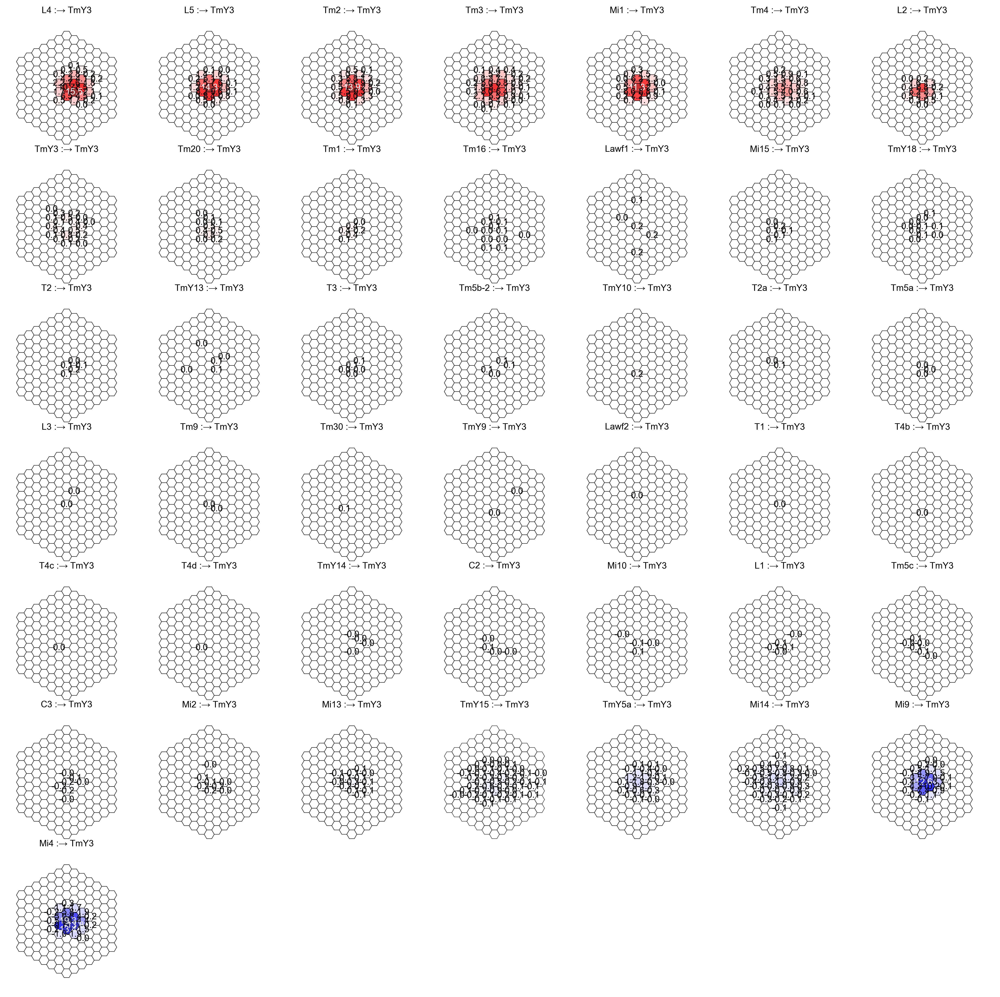

In [429]:
cv.receptive_fields_grid("TmY3")